## Copa América 2024: Who Will Win? 

**Nico Fidalgo**

<hr style="height:2.4pt">

<a id="contents"></a>
### Table of Contents
1. [Project Flow Chart](#flowchart)
1. [Problem Statement](#problemstatement)
1. [Visualization/EDA/Analysis](#eda)
    1. [Import Libraries](#lib)
    1. [Import Data](#data)
    1. [Web Scraping for Advanced Stats](#scraping)
    1. [Missing Data and Feature Selection](#missingandfeatures)
    1. [Visualization and Feature Description](#viz)
1.  [Modeling and Training](#model)
    1. [Logistic Regression Model](#lr)
    1. [Bagging Logistic Regression Model](#lrbag)
    1. [Decision Tree Model](#dt)
    1. [Bagging Decision Tree Model](#dtbag)
    1. [Gradient Descent Model](#gd)
    1. [AdaBoost Model](#ada)
    1. [Random Forest Model](#rf)
    1. [Model Selection](#selection)
1. [Results](#results)
    1. [Simulation Setup](#sim)
    1. [Copa América 2024 Prediction](#ca24)
1. [Conclusion, Inferences, Limitations](#conclusion)
1. [Future Work and Scope of Improvement](#future)

<hr style="height:2.4pt">

<a id="flowchart"></a> 
### Flow Chart

![Flow Chart](images/flowchart.png)

<hr style="height:2.4pt">

<a id="problemstatement"></a> 
### Problem Statement
The goal of this project is to predict the 2024 Copa América. This is an international soccer competition for teams from the North/Central American and South American confederations, CONCACAF and CONMEBOL. I am an avid soccer fan and I believe I am a pro at predicting the next tournament winner, yet somehow the tournament always goes a little differently than I originally anticipated. For example, Morocco made the semi-final of the 2022 World Cup despite being heavily picked to not even advance out of their group. The favorites to win, Brazil, got knocked out by Croatia in the quarter-final. Every single bracket I create always seems to break at some point. This is the problem I am going to address with this project, and apply it directly to the 2024 Copa América that will take place June 20–July 14, 2024.

#### Tournament Structure
16 teams will be competing in this iteration of the Copa América and drawn into 4 groups of 4 teams. Within each group, every team will play each other exactly once. In each match, if there is a winner, they will be awarded 3 points and the loser will be given 0 points. If the game ends in a draw, each team receives 1 point. This means the maximum points a team can receive in the group stage of the tournament is 9 points. At the end of the group stage each team will be ranked according to points and tiebreaks will occur in this order: goal difference (goals for - goals against), goals for, head-to-head record (if when the tied teams played against each other one of them won, that team advances), fair play record (complicated metric that penalizes teams for committing fouls, unlikely it will come down to this), and then a pure random draw if all of these still do not break the tie. The winner of each group will play the runner-up of another group (A1 vs. B2, C1 vs. D2, B1 vs. A2, and D1 vs. C2) in the quarter-finals, and then the semi-finals, third place match, and final.

#### Group Drawing
The group stage draw took place on Dec. 7. CONCACAF #5 and CONCACAF #6 will be played on March 23, 2024 and the winners will advance to the Copa América. CONCACAF #5 is Canada vs. Trinidad & Tobago. CONCACAF #6 is Honduras vs. Costa Rica.

**Group A**
| Pos         | Team        | Pld         | W     | D      | L     | GF     | GA     | GD     | Pts     |
| :---------: | :---------- | :---------: | :---: | :----: | :---: | :----: | :----: | :----: | :-----: |
| 1           | Argentina   | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 2           | Peru        | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 3           | Chile       | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 4           | CONCACAF #5 | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |

**Group B**
| Pos         | Team        | Pld         | W     | D      | L     | GF     | GA     | GD     | Pts     |
| :---------: | :---------- | :---------: | :---: | :----: | :---: | :----: | :----: | :----: | :-----: |
| 1           | Mexico      | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 2           | Ecuador     | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 3           | Venezuela   | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 4           | Jamaica     | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |

**Group C**
| Pos         | Team          | Pld         | W     | D      | L     | GF     | GA     | GD     | Pts     |
| :---------: | :----------   | :---------: | :---: | :----: | :---: | :----: | :----: | :----: | :-----: |
| 1           | United States | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 2           | Uruguay       | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 3           | Panama        | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 4           | Bolivia       | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |

**Group D**
| Pos         | Team        | Pld         | W     | D      | L     | GF     | GA     | GD     | Pts     |
| :---------: | :---------- | :---------: | :---: | :----: | :---: | :----: | :----: | :----: | :-----: |
| 1           | Brazil      | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 2           | Colombia    | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 3           | Paraguay    | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |
| 4           | CONCACAF #6 | 0           | 0     | 0      | 0     | 0      | 0      | 0      | 0       |

[Return to contents](#contents)

<hr style="height:2.4pt">

<a id="eda"></a> 
### Visualization/EDA/Analysis
[Return to contents](#contents)

<a id="lib"></a> 
#### Import Libraries
This code imports all necessary libraries needed for this project.

In [1]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils import resample
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.multiclass import OneVsRestClassifier
import warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.exceptions import DataConversionWarning
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import label_binarize
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.feature_selection import VarianceThreshold
import random

In [2]:
warnings.filterwarnings("ignore")

<a id="data"></a>
#### Import Data
**Gathering the Data (more on this in [Web Scraping for Advanced Stats](#scraping))**

I decided that it would be best to obtain data from FBref.com, a website that contains lots of data for soccer competitions. For this data, I scraped through the competitions page and navigated to all international competitions for all major international confederations that participated in the 2022 World Cup. This is AFC for Asia, AFCON for Africa, CONMEBOL for South America, UEFA for Europe, and CONCACAF for North America. I wanted to obtain all data from 2017 to the present day that FBref had so that I can select windows of time for model training, more on that later. For now, this created a CSV file after approximately 1 hour of running time due to ethical scraping practices and the CSV file that can be accessed [here](data/fbref_data.csv). For references to the web scraping Jupyter Notebook, see [Web Scraping for Advanced Stats](#scraping). Additionally, I downloaded an available Kaggle dataset which can be accessed [here](data/fifa_ranking-2023-07-20.csv) which contained FIFA ranking data for the teams when they played against each other.

**Data Inspection**

I imported the data and inspected the shape. Each of the 2440 rows of `df` are individual matches and each column is a different predictor. As there are so many predictors, I won't explain what they all are just yet [until I select the most important ones](#missingandfeatures). I am motivated to select just the most important features due to problems of high dimensionality when p, or the number of predictors, is very big. Some issues could be that the matrices are not invertible, complicating modeling, multicollinearity is a very plausible complication when dealing with so many predictors, and models are likely to overfit. I also needed to merge `df` and `fifa_ranks` for the matches that they both had.

**Missing Values (more on this in [Missing Data and Feature Selection](#missingandfeatures))**

As you can see after inspecting the data, there are lots of missing values, some columns such as `expected_npxG/Sh` are missing more values than they even have. The explanation for this is that some of the statistics are only tracked in certain confederations, some statistics are only tracked in major competitions like World Cup or Copa América or Euro, and some statistics were added after a date within this time period. It's safe to say the data is Missing At Random, but not Missing Completely At Random. Initially I chose to handle this by using KNNImputer so as to not lose any features, however this compromised model accuracy so for the final model I scrapped this idea and chose to drop all null values. This greatly reduced the size of the dataset, but it did make the model perform far better on the test set of the data, likely due to the fact that KNNImputer was imputing values that did not totally make sense.

In [3]:
# Import the data and inspect the shape
df = pd.read_csv('data/fbref_data.csv')
df.shape

(2440, 132)

In [4]:
# Inspect the data
df.head()

,Date,Time,Comp,Round,Day,Venue,Result,GF,GA,Team,...,misc_Crs,misc_Int,misc_TklW,misc_PKwon,misc_PKcon,misc_OG,misc_Recov,aerial_duels_Won,aerial_duels_Lost,aerial_duels_Won%
0,2020-10-08,21:30,WCQ,WCQ — CONMEBOL (M),Thu,Home,W,1,0,Argentina,...,12.0,16.0,10.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN
1,2020-10-13,16:00,WCQ,WCQ — CONMEBOL (M),Tue,Away,W,2,1,Argentina,...,18.0,12.0,11.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN
2,2020-11-12,21:00,WCQ,WCQ — CONMEBOL (M),Thu,Home,D,1,1,Argentina,...,21.0,13.0,12.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN
3,2020-11-17,19:30,WCQ,WCQ — CONMEBOL (M),Tue,Away,W,2,0,Argentina,...,13.0,15.0,9.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN
4,2021-06-03,21:00,WCQ,WCQ — CONMEBOL (M),Thu,Home,D,1,1,Argentina,...,10.0,12.0,11.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN


In [5]:
# Find number of missing values
df.isna().sum().sort_values(ascending=False)

expected_npxG/Sh     2097
standard_Dist        2097
standard_FK          2096
short_passes_Cmp%    2096
misc_Recov           2096
                     ... 
GF                      0
GA                      0
misc_CrdR               0
misc_2CrdY              0
misc_CrdY               0
Length: 132, dtype: int64

In [6]:
# Remove World Cup 2022 data (this will be used for testing later)
df['Date'] = pd.to_datetime(df['Date'])
wc22 = df[(df['Comp'].str.contains('World Cup')) & (df['Date'].dt.year == 2022)]
df = df[~((df['Comp'].str.contains('World Cup')) & (df['Date'].dt.year == 2022))]

# Merge ranking data with FBref data
fifa_ranks = pd.read_csv('data/fifa_ranking-2023-07-20.csv')

fifa_ranks.rank_date = pd.to_datetime(fifa_ranks.rank_date)
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("IR Iran", "Iran")
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("USA", "united states")
fifa_ranks = fifa_ranks[fifa_ranks.rank_date.dt.year >= 2018]
fifa_ranks = fifa_ranks[['rank', 'country_full', 'rank_date']]
fifa_ranks.country_full = fifa_ranks.country_full.str.lower()

df.Team = df.Team.str.lower()
df.Opponent = df.Opponent.str.lower()
df[['away_abv','Opponent']] = df['Opponent'].str.split(' ', n=1, expand=True)
df.Date = pd.to_datetime(df.Date)

fifa_ranks = fifa_ranks.sort_values(by=['rank_date','country_full'])
df = df.sort_values(by =['Date','Team'])

merged = pd.merge_asof(df, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Team', right_by='country_full', direction='backward')
merged_2 = pd.merge_asof(merged, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Opponent', right_by='country_full', direction='backward', suffixes=[None, '_right'])
merged_2 = merged_2.rename({'rank':'team_rank', 'rank_right':'opponent_rank'}, axis=1)
merged_2 = merged_2.drop(columns=['away_abv', 'country_full', 'rank_date','country_full_right','rank_date_right'])
df = merged_2

# Remove columns that indicate the number of goals scored as well as unnecessary columns
df = df.drop(['Date', 'Time', 'Comp', 'Round', 'Day', 'GF', 'GA', 'standard_Gls', 'standard_G/Sh', 'standard_G/SoT', 'standard_PK', 'expected_npxG', 'expected_G-xG', 'passing_Ast', 'Team', 'Opponent', 'gca_GCA', 'gca_PassLive', 'gca_PassDead', 'gca_TO', 'gca_Sh', 'gca_Fld', 'gca_Def', 'sca_TO', 'misc_OG', 'expected_np:G-xG', 'passing_xAG'], axis=1)
print(f'The shape of df is {df.shape}')

# Create X and y, encode 0, 1, 2 instead of W, D, L, drop duplicate columns
df['Result'] = df['Result'].map({'W': 1, 'L': 0, 'D': 2})
df['Venue'] = df['Venue'].map({'Home': 1, 'Away': 0, 'Neutral': 2})
X = df.drop('Result', axis=1)
y = df[['Result']]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=1)

print(f'The shape of X_train is {X_train.shape}')
print(f'The shape of X_test is {X_test.shape}')
print(f'The shape of y_train is {y_train.shape}')
print(f'The shape of y_test is {y_test.shape}')

The shape of df is (2312, 107)
The shape of X_train is (1618, 106)
The shape of X_test is (694, 106)
The shape of y_train is (1618, 1)
The shape of y_test is (694, 1)


In [7]:
list(df.columns)

['Venue',
 'Result',
 'standard_Sh',
 'standard_SoT',
 'standard_SoT%',
 'standard_Dist',
 'standard_FK',
 'standard_PKatt',
 'expected_xG',
 'expected_npxG/Sh',
 'total_passes_Cmp',
 'total_passes_Att',
 'total_passes_Cmp%',
 'total_passes_TotDist',
 'total_passes_PrgDist',
 'short_passes_Cmp',
 'short_passes_Att',
 'short_passes_Cmp%',
 'medium_passes_Cmp',
 'medium_passes_Att',
 'medium_passes_Cmp%',
 'long_passes_Cmp',
 'long_passes_Att',
 'long_passes_Cmp%',
 'passing_xA',
 'passing_KP',
 'passing_1/3',
 'passing_PPA',
 'passing_CrsPA',
 'passing_PrgP',
 'pass_types_Att',
 'pass_types_Live',
 'pass_types_Dead',
 'pass_types_FK',
 'pass_types_TB',
 'pass_types_Sw',
 'pass_types_Crs',
 'pass_types_TI',
 'pass_types_CK',
 'corners_In',
 'corners_Out',
 'corners_Str',
 'outcomes_Cmp',
 'outcomes_Off',
 'outcomes_Blocks',
 'sca_SCA',
 'sca_PassLive',
 'sca_PassDead',
 'sca_Sh',
 'sca_Fld',
 'sca_Def',
 'tackles_Tkl',
 'tackles_TklW',
 'tackles_Def 3rd',
 'tackles_Mid 3rd',
 'tackles_At

<a id="scraping"></a>
#### Web Scraping for Advanced Stats
As aforementioned, I scraped FBref for the data that I am working with. This is what the code looked like. _(I am using a screenshot because this code takes about an hour to run)_

![Scraping Image 1](images/scrape1.png)
![Scraping Image 2](images/scrape2.png)
![Scraping Image 3](images/scrape3.png)
![Scraping Image 4](images/scrape4.png)
![Scraping Image 5](images/scrape5.png)
![Scraping Image 6](images/scrape6.png)

<a id="missingandfeatures"></a>
#### Missing Data and Feature Selection
**KNNImputer to Handle Missing Data**

As I saw when [importing our data](#data), there is a lot of missing data. So much of it that if I was to drop all entries with missing data I'd lose 86% of the dataset! Due to this, I decided to impute reasonable values for the missing data. Because the data is Missing At Random, I was deciding between imputing the mean however that looks (mean for specific teams, mean for the entire dataset, etc.) or kNN imputing. I decided on kNN imputing because I wanted the imputed data to be similar to data that was closest to it. The reason for this is that say in a particular match a team had possession of the ball for 10% of the match and their opponent had 90% of the possession. If this were the case, it would be a bit unreasonable for the team with 10% possession to have lots of touches in the attacking 3rd of the pitch, as they barely even had the ball. I believed that kNN imputing would follow this logic most effectively, whereas mean imputing could impute unreasonable values. I somewhat arbitrarily decided on $k=5$ nearest neighbors. Any more and there was risk that a match with very different statistics would hold weight in the imputed value, and any fewer and it would be too closely related to a specific match. This would be bad because remember, in soccer there is a lot of randomness in every match (a team can score 5 goals from 5 shots or 0 goals from the same amount of shots for example).

**PCA for Feature Selection**

After doing this I scaled the data so that categories with higher values such as possession would not be biased towards due to their magnitudes. Then I performed PCA to filter out the components that explained very little variance in the data. This left the top features, and I redefined X to be the set of top features, or, just the important predictors. This was our method of reducing the dimensionality of the data to reduce risk of overfitting, collinearity, etc. as aforementioned when I [inspected the data](#data).

In [8]:
# Impute missing data
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)

# Scale the data
scaler = StandardScaler()
X_train_std = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_std = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

# Perform PCA
pca = PCA(n_components=0.95)
X_train_pca = pd.DataFrame(pca.fit_transform(X_train_std), columns=[f'PC{i + 1}' for i in range(pca.n_components_)])
X_test_pca = pd.DataFrame(pca.transform(X_test_std), columns=[f'PC{i + 1}' for i in range(pca.n_components_)])

# Concatenate train_df and test_df
train_df = pd.concat([X_train_pca, y_train], axis=1)
test_df = pd.concat([X_test_pca, y_test], axis=1)

# Concatenate df
df = pd.concat([train_df, test_df], axis=0)

In [9]:
# Drop added null values
df = df.dropna()
train_df = train_df.dropna()
test_df = test_df.dropna()
X_train = train_df.drop('Result', axis=1)
X_test = test_df.drop('Result', axis=1)
y_train = train_df['Result']
y_test = test_df['Result']

# Inspect shapes
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1130, 42)
(206, 42)
(1130,)
(206,)


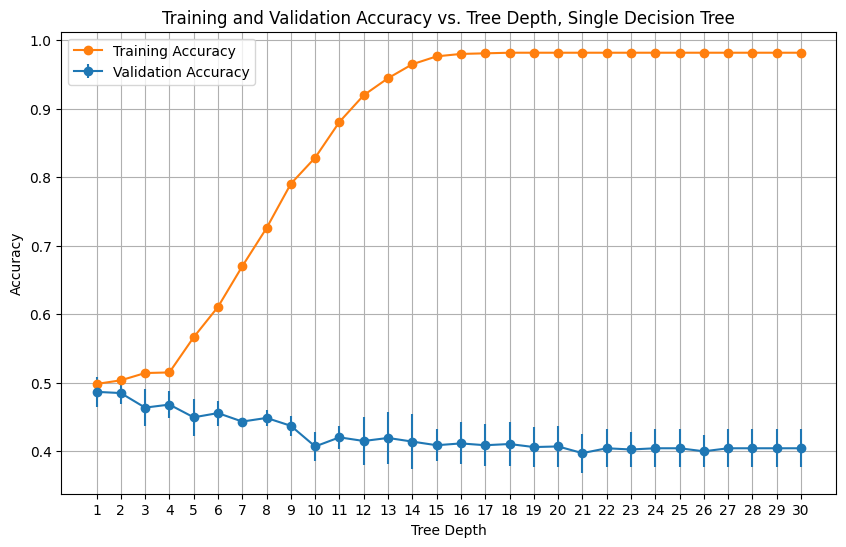

In [10]:
# Cross-validating single decision tree to find optimal max_depth
cvmeans = []
cvstds = []
train_scores = []
depths = list(range(1, 31))
cv = 5

for depth in depths:
    dt = DecisionTreeClassifier(max_depth=depth, random_state=1)
    train_scores.append(dt.fit(X_train, y_train).score(X_train, y_train))
    scores = cross_val_score(estimator=dt, X=X_train, y=y_train, cv=cv)
    cvmeans.append(scores.mean())
    cvstds.append(scores.std())

plt.figure(figsize=(10, 6))
plt.errorbar(depths, cvmeans, yerr=cvstds, label='Validation Accuracy', marker='o')
plt.plot(depths, train_scores, label='Training Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1, 31, 1))
plt.title('Training and Validation Accuracy vs. Tree Depth, Single Decision Tree')
plt.legend()
plt.grid(True)

In [11]:
# Finding optimal depth, evaluating on train and test set
best_depth = depths[np.argmax(cvmeans)]
dt = DecisionTreeClassifier(max_depth=best_depth, random_state=1).fit(X_train, y_train)
dt_train_score = dt.score(X_train, y_train)
dt_test_score = dt.score(X_test, y_test)

print(f'Single depth-{best_depth} Decision Tree \nTrain: {dt_train_score:.4f}\nTEST: {dt_test_score:.4f}')

Single depth-1 Decision Tree 
Train: 0.4982
TEST: 0.4757


Text(0.5, 1.0, 'Confusion Matrix Single Decision Tree 47.57%')

<Figure size 800x600 with 0 Axes>

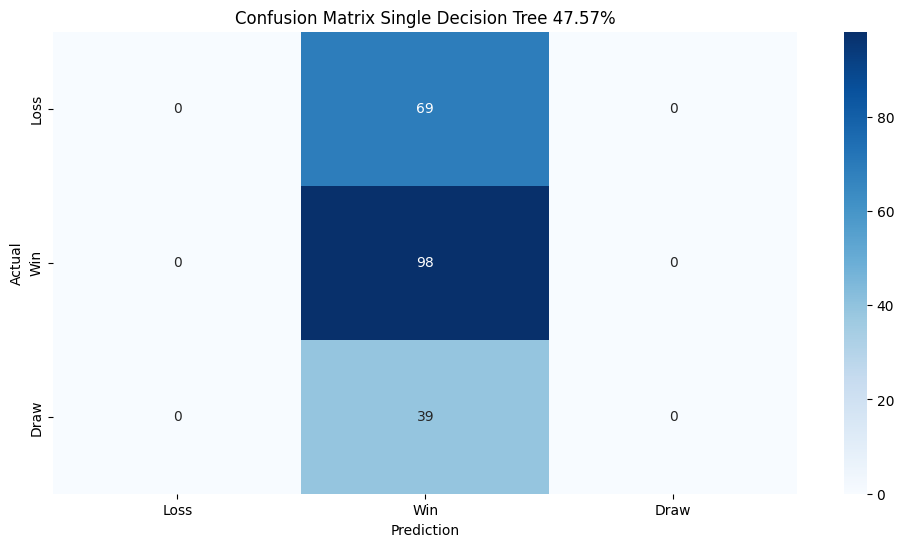

In [12]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
y_pred = dt.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Single Decision Tree {dt_test_score*100:.2f}%')

**Next steps:**
Based on the confusion matrix and the model accuracy, moving forward with this dataset would be a bad idea. I troubleshooted this for a long time, testing different `n_neighbors` with KNNImputer, testing SimpleImputer to use mean imputing, etc. All of these made the model favor selecting wins. Then I experimented using RandomUndersampler in order to make the test data have an equal number of wins, losses, and draws so the model would not be biased to pick one over the other, still to no avail. In fact this made the model even worse at predicting the outcome than random guessing (<33% test accuracy). As a result, I decided to move forward with dropping all of the null values at the expense of decreasing the number of observations. As mentioned previously, this reduced our dataset by ~86%, but this did greatly improve model performance, as will be seen later when I am training the different models. Below is the code preparing for that.

In [13]:
# Step 0: Reload the data
df = pd.read_csv('data/fbref_data.csv')

df['Date'] = pd.to_datetime(df['Date'])
wc22 = df[(df['Comp'].str.contains('World Cup')) & (df['Date'].dt.year == 2022)]
df = df[~((df['Comp'].str.contains('World Cup')) & (df['Date'].dt.year == 2022))]

fifa_ranks = pd.read_csv('data/fifa_ranking-2023-07-20.csv')

fifa_ranks.rank_date = pd.to_datetime(fifa_ranks.rank_date)
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("IR Iran", "Iran")
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("USA", "united states")
fifa_ranks = fifa_ranks[fifa_ranks.rank_date.dt.year >= 2018]
fifa_ranks = fifa_ranks[['rank', 'country_full', 'rank_date']]
fifa_ranks.country_full = fifa_ranks.country_full.str.lower()

df.Team = df.Team.str.lower()
df.Opponent = df.Opponent.str.lower()
df[['away_abv','Opponent']] = df['Opponent'].str.split(' ', n=1, expand=True)
df.Date = pd.to_datetime(df.Date)

fifa_ranks = fifa_ranks.sort_values(by=['rank_date','country_full'])
df = df.sort_values(by =['Date','Team'])

merged = pd.merge_asof(df, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Team', right_by='country_full', direction='backward')
merged_2 = pd.merge_asof(merged, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Opponent', right_by='country_full', direction='backward', suffixes=[None, '_right'])
merged_2 = merged_2.rename({'rank':'team_rank', 'rank_right':'opponent_rank'}, axis=1)
merged_2 = merged_2.drop(columns=['away_abv', 'country_full', 'rank_date','country_full_right','rank_date_right'])
merged_2 = merged_2.dropna()
df = merged_2

df = df.drop(['Date', 'Time', 'Comp', 'Round', 'Day', 'GF', 'GA', 'standard_Gls', 'standard_G/Sh', 'standard_G/SoT', 'standard_PK', 'expected_npxG', 'expected_G-xG', 'passing_Ast', 'Team', 'Opponent', 'gca_GCA', 'gca_PassLive', 'gca_PassDead', 'gca_TO', 'gca_Sh', 'gca_Fld', 'gca_Def', 'sca_TO', 'misc_OG', 'expected_np:G-xG', 'passing_xAG'], axis=1)
df = df.dropna()
print(f'The shape of df is {df.shape}')

df['Result'] = df['Result'].map({'W': 1, 'L': 0, 'D': 2})
df['Venue'] = df['Venue'].map({'Home': 1, 'Away': 0, 'Neutral': 2})
X = df.drop('Result', axis=1)
y = df[['Result']]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=1)

# Step 1: Feature Selection using VarianceThreshold
selector = VarianceThreshold(threshold=0.95)
X_train_selected = selector.fit_transform(X_train)
X_test_selected = selector.transform(X_test)

# Step 2: Create DataFrames for selected features
columns_selected = X_train.columns[selector.get_support()]
X_train_selected_df = pd.DataFrame(data=X_train_selected, columns=columns_selected, index=X_train.index)
X_test_selected_df = pd.DataFrame(data=X_test_selected, columns=columns_selected, index=X_test.index)

# Step 3: Concatenate into train_df and test_df
train_df = pd.concat([X_train_selected_df, y_train], axis=1)
test_df = pd.concat([X_test_selected_df, y_test], axis=1)
df = pd.concat([train_df, test_df], axis=0)

# Step 4: Inspect the shape
print('Original Training Shape:', X_train.shape)
print('Transformed Training Shape:', X_train_selected_df.shape)
print('Concatenated Training Shape:', train_df.shape)

print('\nOriginal Test Shape:', X_test.shape)
print('Transformed Test Shape:', X_test_selected_df.shape)
print('Concatenated Test Shape:', test_df.shape)

The shape of df is (194, 107)
Original Training Shape: (135, 106)
Transformed Training Shape: (135, 94)
Concatenated Training Shape: (135, 95)

Original Test Shape: (59, 106)
Transformed Test Shape: (59, 94)
Concatenated Test Shape: (59, 95)


In [14]:
X_train = train_df.drop('Result', axis=1)
X_test = test_df.drop('Result', axis=1)
y_train = train_df['Result']
y_test = test_df['Result']

<a id="viz"></a>
#### Visualization and Feature Description
**Feature Description**

After only including the columns that explain 95% of the variance of the response, I am left with many many predictors. Instead of describing each predictor, I will describe what the what the different abbreviations mean as each statistic is a combination of abbreviations.
* `Venue`: 0 if match was played away, 1 if match was played at home, 2 if match was played at neutral venue
* `Result`: 0 for loss, 1 for win, 2 for draw (tie)
* `Sh`: shot
* `SoT`: shot on target
* `SoT%`: percent of total shots that were on target (SoT/Sh)
* `Dist`: distance
* `FK`: free kick
* `PKatt`: penalty kick attempt
* `xG`: expected goals (advanced statistic that is computed based on a teams' quality of shots)
* `npxG/Sh`: non-penalty expected goals per shot
* `Cmp`: completed, meaning that a pass was not turned over to the opposing team
* `Att`: attempted
* `Cmp%`: Cmp/Att, rate of passes that were completed and not turned over
* `xA`: expected assists
* `KP`: key passes, passes that led to a goal-scoring opportunity
* `Crs`: crosses (when a ball is played from the sides of the pitch into the middle aerially)
* `Prg`: progress
* `Live`: ball was in play when the move was made
* `Dead`: ball was out of play when the move was made
* `TB`: through ball, ball passed in front of a player and they run to meet it
* `TI`: throw-in
* `SCA`: shot-creating-action
* `Tkl`: tackle
* `Succ`: successful
* `Rec`: received
* `CrdY`: yellow card
* `2CrdY`: double yellow cards
* `CrdR`: red cards

**Visualization**

It is useful to visualize the features when they are plotted against each other. This is to inspect collinearity to see if any columns have a combined interaction. If I was to perform PCA as I had tried to do earlier, this would be handled and terms that are related would be expressed as linear combinations of one another, however PCA greatly worsened model performance.

In [15]:
fig, axs = plt.subplots(nrows=len(df.columns), ncols=2, figsize=(20, 400))
i = 0
for feature in df.columns:
    sns.scatterplot(x='touches_Att 3rd', y=feature, data=df, ax=axs[i, 0])
    sns.kdeplot(x='touches_Att 3rd', y=feature, data=df, ax=axs[i, 1], warn_singular=False)
    i += 1

<hr style="height:2.4pt">

<a id="model"></a> 
### Modeling and Training
In order to train our model, I considered a variety of models. There is no obvious choice in a classification model, so I decided to compare each of the following against each other: [Logistic Regression](#lr), [Bagging Logistic Regressions](#lrbag), [Single Decision Tree](#dt), [Bagging Decision Trees](#dtbag), [Gradient Descent](#gd), [AdaBoost](#ada), and [Random Forest](#rf). In order to make a robust and thorough selection, I performed cross-validation on relevant hyperparameters using a grid search in some cases or simple cross-validation techniques so that I could obtain the best performing version of each model before making a comparison.

[Return to contents](#contents)

<a id="lr"></a>
#### Logistic Regression Model
The Logistic Regression model has to be prepared for multiclass classification. It is dependent on `max_iter` and `solver` which dictates how the model will converge to its optimized value. These values will not be cross-validated as they will not impact performance too much.

In [16]:
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=1).fit(X_train, y_train)
lr_train_score = lr.score(X_train, y_train)
lr_test_score = lr.score(X_test, y_test)

print(f'Logistic Regression Model \nTrain: {lr_train_score:.4f}\nTEST: {lr_test_score:.4f}')

Logistic Regression Model 
Train: 0.8296
TEST: 0.6271


Text(0.5, 1.0, 'Confusion Matrix Logistic Regression 62.71%')

<Figure size 800x600 with 0 Axes>

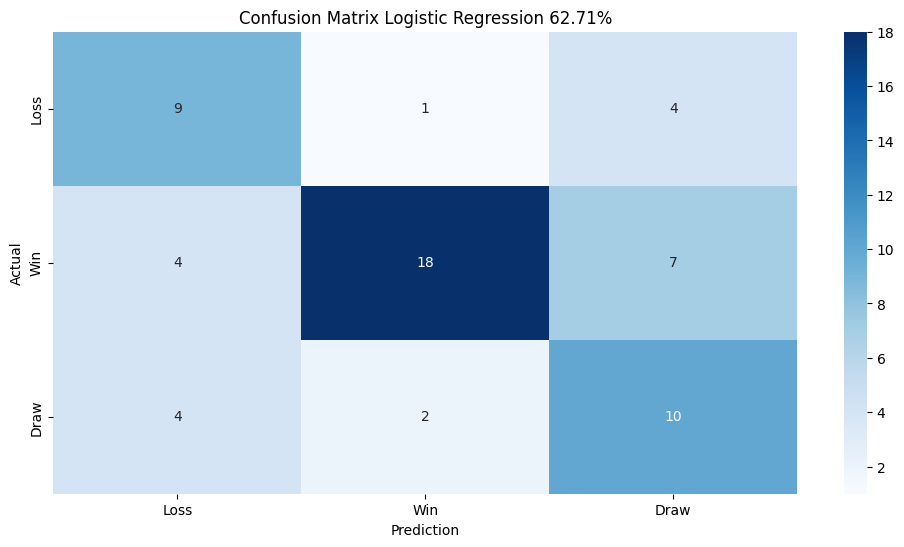

In [17]:
plt.figure(figsize=(8, 6))
y_pred = lr.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Logistic Regression {lr_test_score*100:.2f}%')

<a id="lrbag"></a>
#### Bagging Logistic Regression Model
The next model is Bagging with Logistic Regression models. Due to runtime issues, I did not cross-validate the `max_samples`, `n_estimators`, and `max_features` parameters using GridSearchCV. This means I did not find the best possible version of this model to use in comparison [later](#selection), but still got a really good version of the model.

Bagging Logistic Regression
Train: 0.9704
TEST: 0.6610


<Figure size 800x600 with 0 Axes>

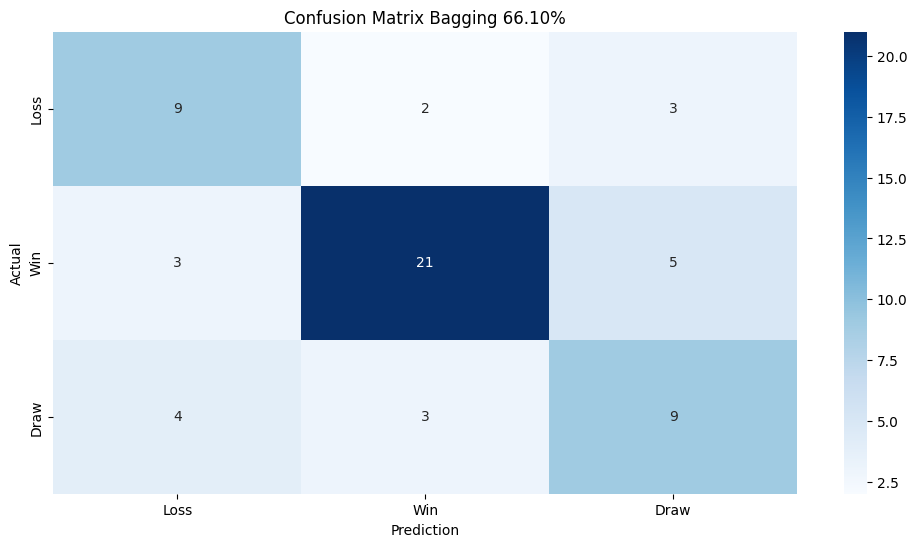

In [18]:
# Evaluate the model 
bagging_lr = BaggingClassifier(estimator=LogisticRegression(max_iter=1000, solver='lbfgs',random_state=1), n_estimators=200, random_state=1).fit(X_train, y_train)
bagging_lr_train_score = bagging_lr.score(X_train, y_train)
bagging_lr_test_score = bagging_lr.score(X_test, y_test)

plt.figure(figsize=(8, 6))
y_pred = bagging_lr.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Bagging {bagging_lr_test_score*100:.2f}%')

print(f'Bagging Logistic Regression\nTrain: {bagging_lr_train_score:.4f}\nTEST: {bagging_lr_test_score:.4f}')

<a id="dt"></a>
#### Decision Tree Model
The Single Decision Tree model is dependent on the maximum depth of the tree. Therefore, I elected to perform cross-validation for the tuning of the `max_depth` hyperparameter. The best depth was determined by finding the model that performed best on the test set after performing cross-validation. Because I am dealing with multi-class classification as I am predicting a win, draw, or loss, I wanted to make sure that the integrated multi-class handling of `DecisionTreeClassifier` performed better than a One vs. Rest (OvR) model. I evaluated this and came to the conlcusion both models performed identically, therefore, I elected to go with the integrated handling in most of scikit's classification models for simplicity.

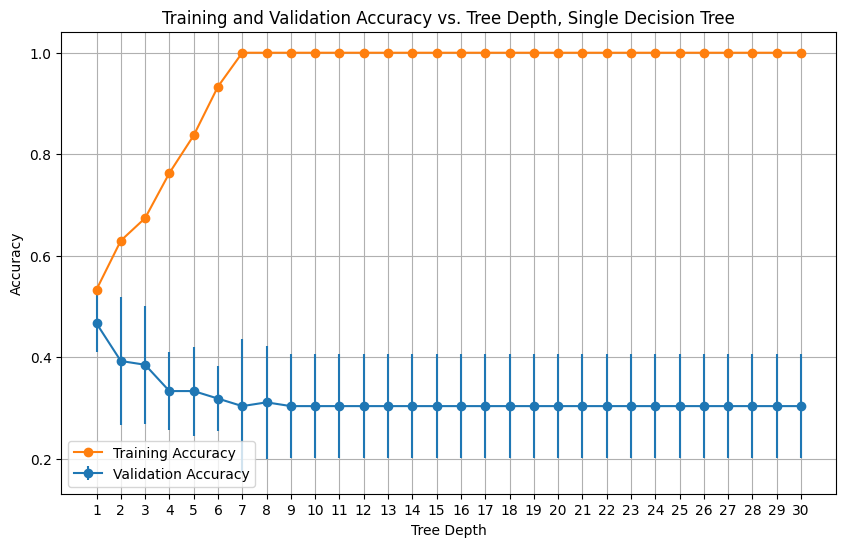

In [19]:
# Cross-validating single decision tree to find optimal max_depth
cvmeans = []
cvstds = []
train_scores = []
depths = list(range(1, 31))
cv = 5

for depth in depths:
    dt = DecisionTreeClassifier(max_depth=depth, random_state=1)
    train_scores.append(dt.fit(X_train, y_train).score(X_train, y_train))
    scores = cross_val_score(estimator=dt, X=X_train, y=y_train, cv=cv)
    cvmeans.append(scores.mean())
    cvstds.append(scores.std())

plt.figure(figsize=(10, 6))
plt.errorbar(depths, cvmeans, yerr=cvstds, label='Validation Accuracy', marker='o')
plt.plot(depths, train_scores, label='Training Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.xticks(np.arange(1, 31, 1))
plt.title('Training and Validation Accuracy vs. Tree Depth, Single Decision Tree')
plt.legend()
plt.grid(True)

In [20]:
# Finding optimal depth, evaluating on train and test set
best_depth = depths[np.argmax(cvmeans)]
dt = DecisionTreeClassifier(max_depth=best_depth, random_state=1).fit(X_train, y_train)
dt_train_score = dt.score(X_train, y_train)
dt_test_score = dt.score(X_test, y_test)

print(f'Single depth-{best_depth} Decision Tree \nTrain: {dt_train_score:.4f}\nTEST: {dt_test_score:.4f}')

Single depth-1 Decision Tree 
Train: 0.5333
TEST: 0.4576


Text(0.5, 1.0, 'Confusion Matrix Single Decision Tree 45.76%')

<Figure size 800x600 with 0 Axes>

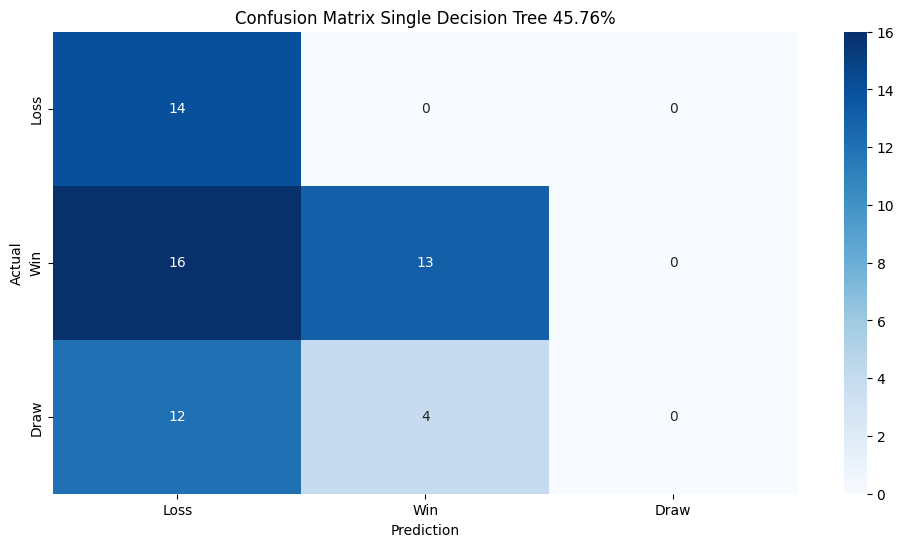

In [21]:
plt.figure(figsize=(8, 6))
y_pred = dt.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Single Decision Tree {dt_test_score*100:.2f}%')

**Other multiclass classification methods:**
I investigated using the One vs. Rest method for multiclass classification to compare performance. This resulted in the same accuracy, so for future models I ignored this possibility.

In [22]:
# Compare with cross-validated OvR method for multiclass classification
cvmeans = []
cvstds = []
train_scores = []
depths = list(range(1, 31))
cv = 5

for depth in depths:
    dt_ovr = OneVsRestClassifier(DecisionTreeClassifier(max_depth=depth, random_state=1))
    train_scores.append(dt_ovr.fit(X_train, y_train).score(X_train, y_train))
    scores = cross_val_score(estimator=dt_ovr, X=X_train, y=y_train, cv=cv)
    cvmeans.append(scores.mean())
    cvstds.append(scores.std())

best_depth_ovr = depths[np.argmax(cvmeans)]
dt_ovr = DecisionTreeClassifier(max_depth=best_depth_ovr, random_state=1).fit(X_train, y_train)
dt_ovr_train_score = dt.score(X_train, y_train)
dt_ovr_test_score = dt.score(X_test, y_test)

print(f'Single depth-{best_depth_ovr} Decision Tree \nTrain: {dt_ovr_train_score:.4f}\nTEST: {dt_ovr_test_score:.4f}')

Single depth-1 Decision Tree 
Train: 0.5333
TEST: 0.4576


<a id="dtbag"></a>
#### Bagging Decision Trees Model
The next model was the bagging model, where I bagged decision trees. I needed to optimize multiple parameters here, such as `max_depth` of the decision tree, `n_estimators`, and `max_features` considered at each split. To do this I used `GridSearchCV` and performed cross-validation, plotted each of the results, and then evaluated the optimized model on both the train and test set.

Text(0, 0.5, 'Mean Test Score')

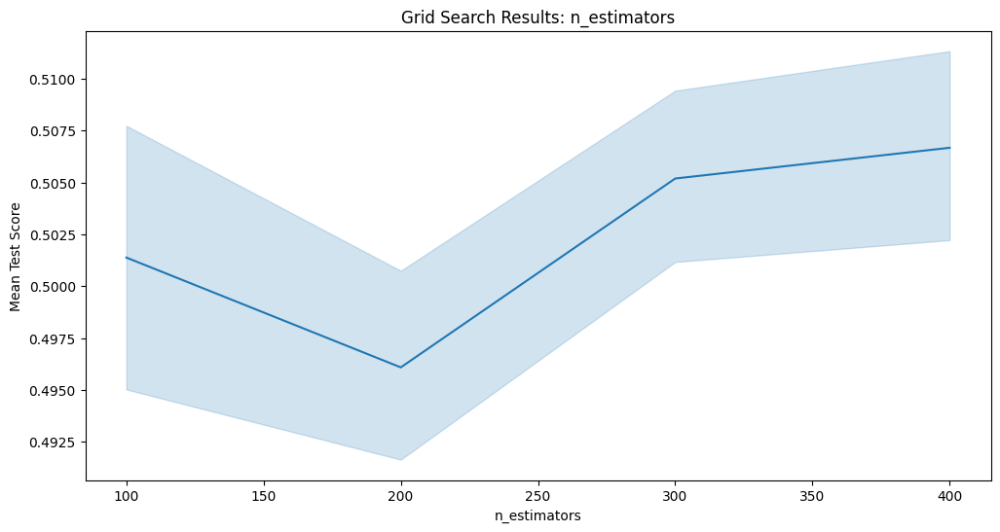

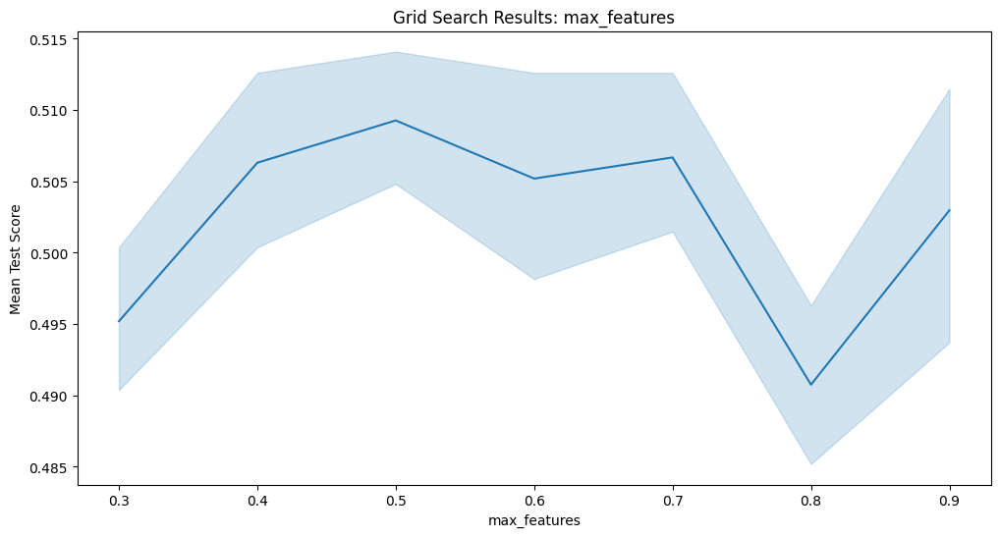

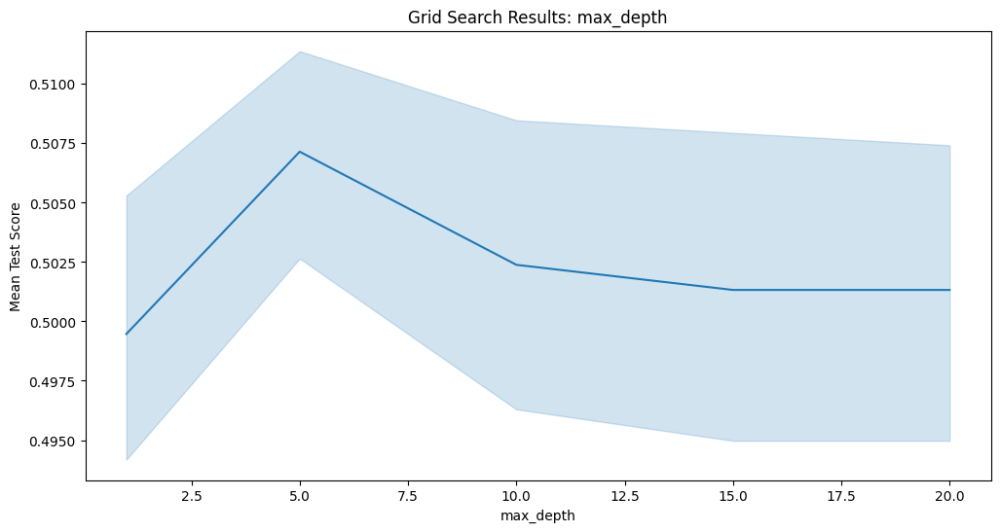

In [23]:
# Perform the grid search cross-validation for best parameters
model = BaggingClassifier(estimator=DecisionTreeClassifier(random_state=1), random_state=1, n_jobs=-1)
param_grid = {'estimator__max_depth': [1, 5, 10, 15, 20], 'n_estimators': [100, 200, 300, 400], 'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}
grid_search = GridSearchCV(model, param_grid, cv=5).fit(X_train, y_train)

# Find the best parameters
best_params = grid_search.best_params_
results = pd.DataFrame(grid_search.cv_results_)

# Plotting results of grid search cross-validation
plt.figure(figsize=(12, 6))
sns.lineplot(x='param_n_estimators', y='mean_test_score', data=results)
plt.title('Grid Search Results: n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_max_features', y='mean_test_score', data=results)
plt.title('Grid Search Results: max_features')
plt.xlabel('max_features')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_estimator__max_depth', y='mean_test_score', data=results)
plt.title('Grid Search Results: max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Test Score')

Bagging Decision Trees Model with parameters: {'estimator__max_depth': 10, 'max_features': 0.6, 'n_estimators': 100}
Train: 1.0000
TEST: 0.5424


<Figure size 800x600 with 0 Axes>

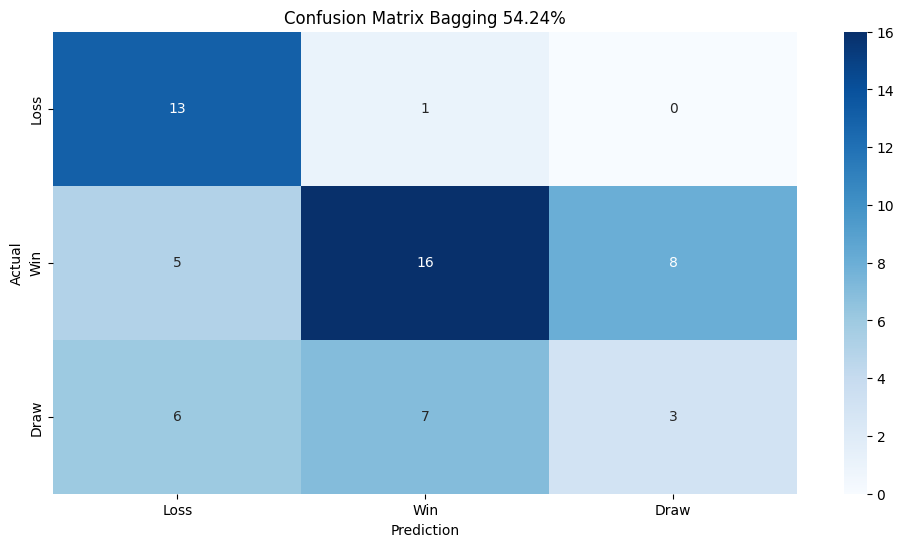

In [24]:
# Evaluate the model 
bagging_dt = BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=best_params['estimator__max_depth'], random_state=1), max_features=best_params['max_features'], n_estimators=best_params['n_estimators'], random_state=1).fit(X_train, y_train)
bagging_dt_train_score = bagging_dt.score(X_train, y_train)
bagging_dt_test_score = bagging_dt.score(X_test, y_test)

plt.figure(figsize=(8, 6))
y_pred = bagging_dt.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Bagging {bagging_dt_test_score*100:.2f}%')

print(f'Bagging Decision Trees Model with parameters: {best_params}\nTrain: {bagging_dt_train_score:.4f}\nTEST: {bagging_dt_test_score:.4f}')

<a id="gd"></a>
#### Gradient Descent Bagging Model
The next model was the Gradient Descent model. Again I implemented bagging with decision trees, so I retained the hyperparameters `n_estimators` and `max_depth`, but this time I also looked to optimize `learning_rate`. Because gradient descent is not parallelizible, I decided to decrease the dimension of the parameter grid to facilitate faster optimizing at the expense of not finding the utmost perfect combination of parameters.

Text(0, 0.5, 'Mean Test Score')

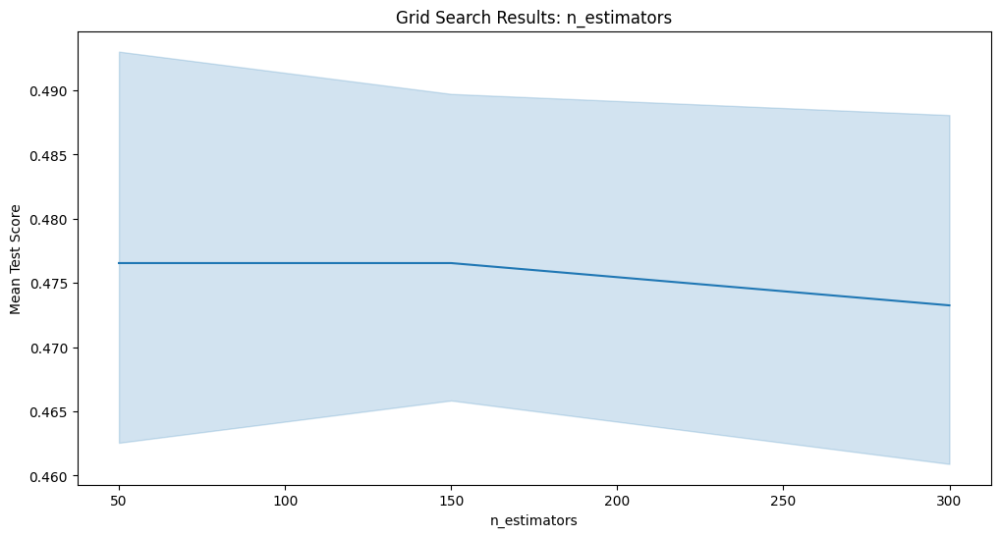

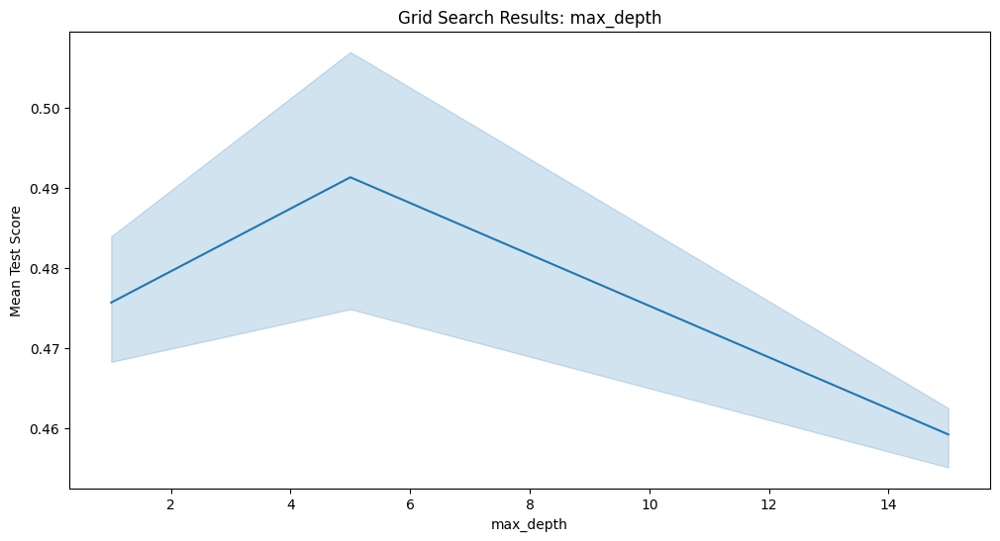

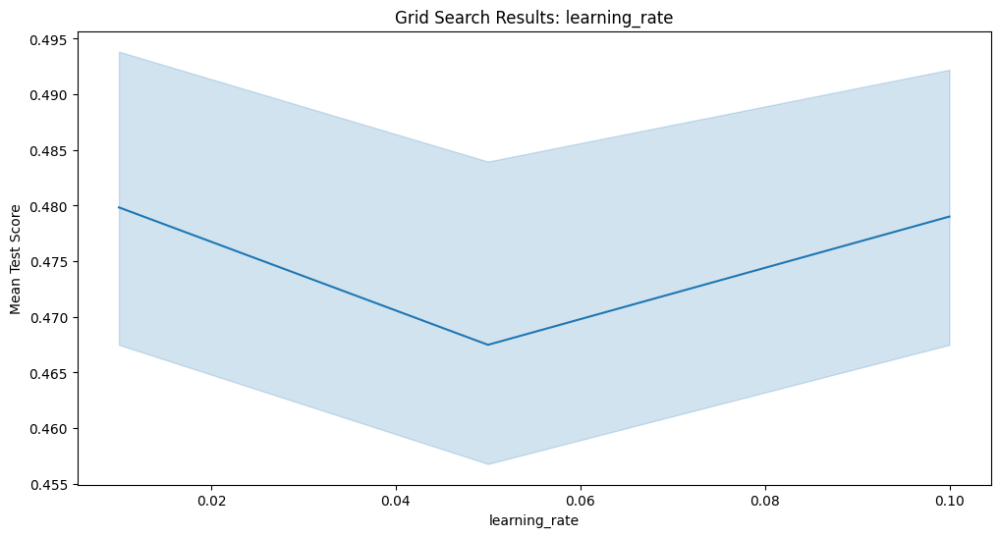

In [25]:
# Perform the grid search cross-validation for best parameters
param_grid = {'n_estimators': [50, 150, 300], 'max_depth': [1, 5, 15], 'learning_rate': [0.01, 0.05, 0.1]}
grid_search = GridSearchCV(GradientBoostingClassifier(random_state=1), param_grid, cv=5).fit(X_train, y_train)

# Find the best parameters
best_params = grid_search.best_params_
results2 = pd.DataFrame(grid_search.cv_results_)

# Plotting results of grid search cross-validation
plt.figure(figsize=(12, 6))
sns.lineplot(x='param_n_estimators', y='mean_test_score', data=results2)
plt.title('Grid Search Results: n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_max_depth', y='mean_test_score', data=results2)
plt.title('Grid Search Results: max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_learning_rate', y='mean_test_score', data=results2)
plt.title('Grid Search Results: learning_rate')
plt.xlabel('learning_rate')
plt.ylabel('Mean Test Score')

Gradient Descent Bagging with parameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 50}
Train: 1.0000
TEST: 0.5424


<Figure size 800x600 with 0 Axes>

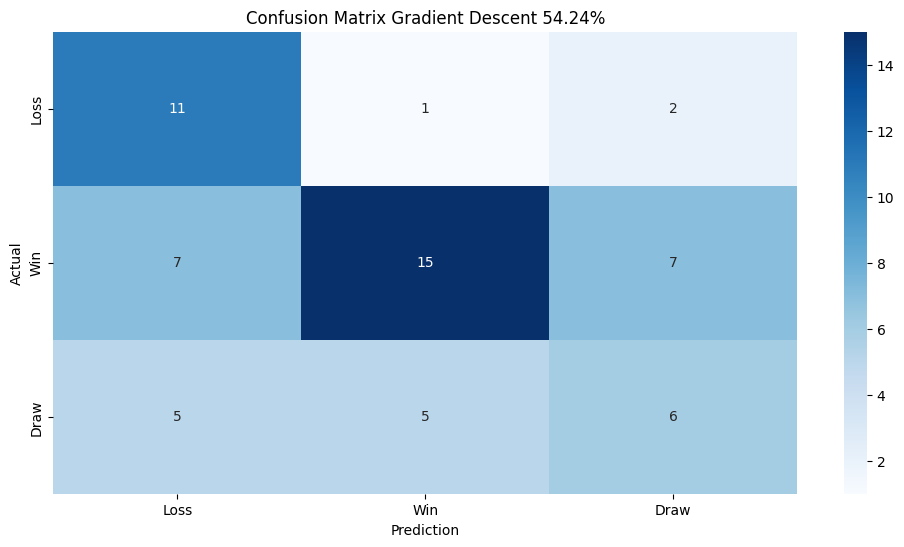

In [26]:
# Evaluate the model 
gd = GradientBoostingClassifier(**best_params, random_state=1).fit(X_train, y_train)
gd_train_score = gd.score(X_train, y_train)
gd_test_score = gd.score(X_test, y_test)

plt.figure(figsize=(8, 6))
y_pred = gd.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Gradient Descent {gd_test_score*100:.2f}%')

print(f'Gradient Descent Bagging with parameters: {best_params}\nTrain: {gd_train_score:.4f}\nTEST: {gd_test_score:.4f}')

<a id="ada"></a>
#### AdaBoost Model
Next was the AdaBoost model with decision trees again. I looked to optimize `n_estimators`, `max_depth`, and `learning_rate`.

Text(0, 0.5, 'Mean Test Score')

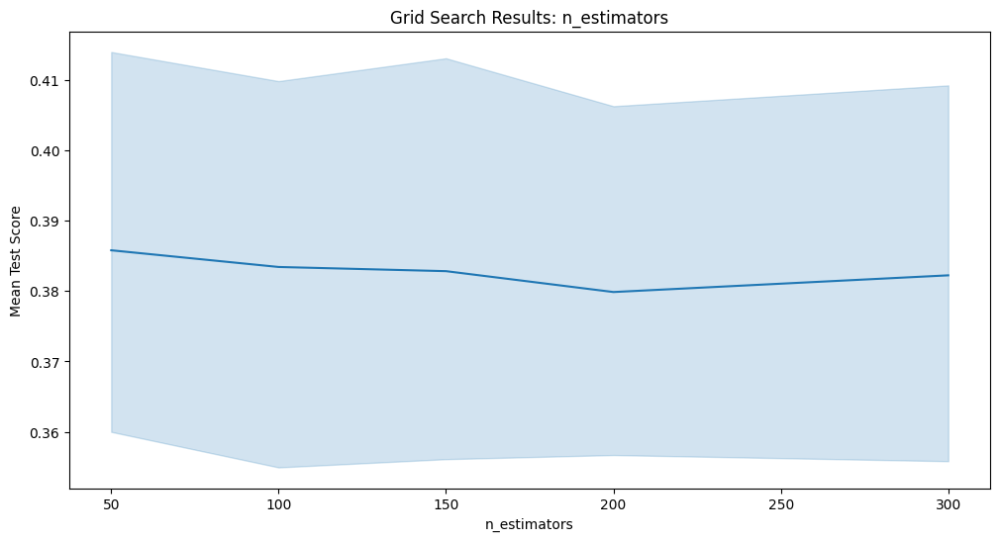

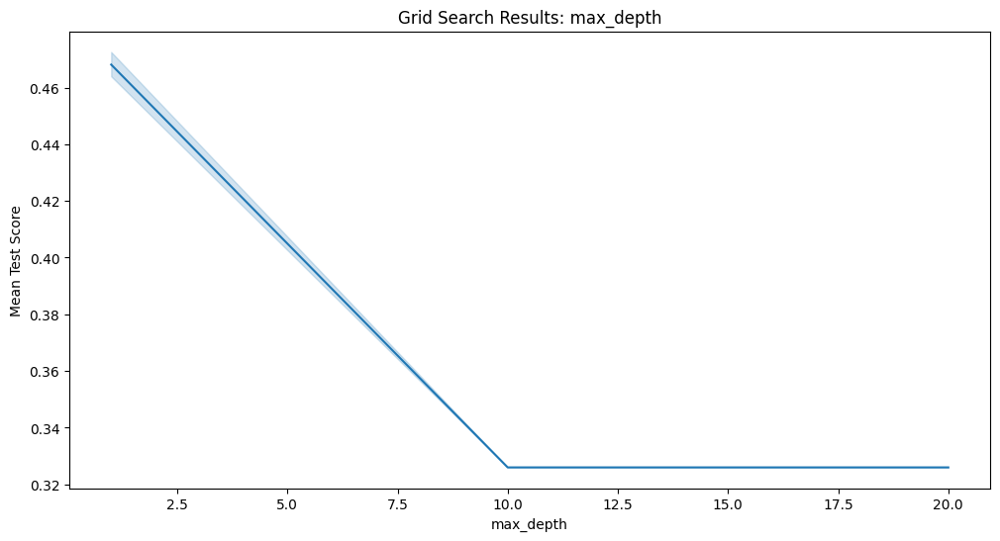

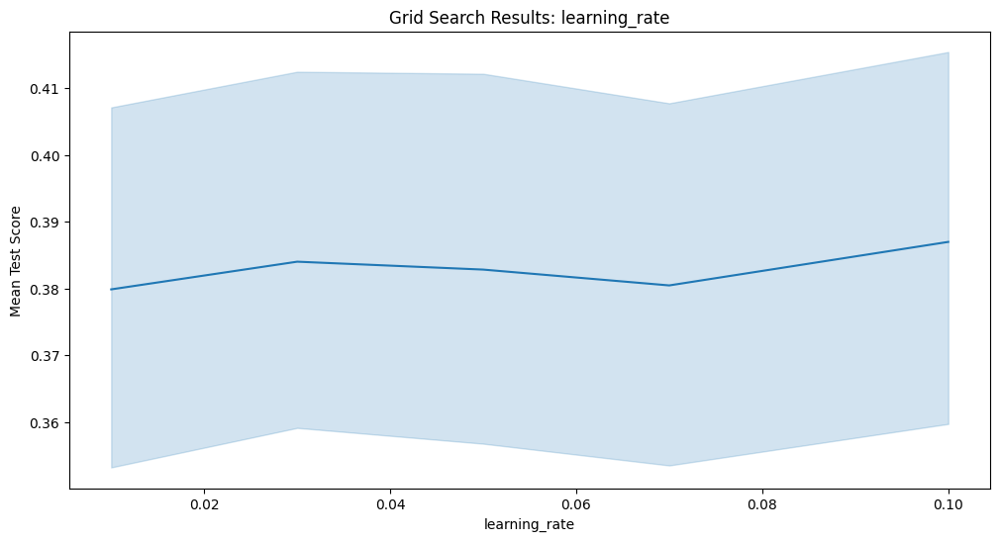

In [27]:
# Perform the grid search cross-validation for best parameters
model = AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=1), random_state=1, algorithm='SAMME')
param_grid = {'n_estimators': [50, 100, 150, 200, 300], 'estimator__max_depth': [1, best_depth, 10, 15, 20], 'learning_rate': [0.01, 0.03, 0.05, 0.07, 0.1]}
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1).fit(X_train, y_train)

# Find the best parameters
best_params = grid_search.best_params_
results3 = pd.DataFrame(grid_search.cv_results_)

# Plotting results of grid search cross-validation
plt.figure(figsize=(12, 6))
sns.lineplot(x='param_n_estimators', y='mean_test_score', data=results3)
plt.title('Grid Search Results: n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_estimator__max_depth', y='mean_test_score', data=results3)
plt.title('Grid Search Results: max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_learning_rate', y='mean_test_score', data=results3)
plt.title('Grid Search Results: learning_rate')
plt.xlabel('learning_rate')
plt.ylabel('Mean Test Score')

AdaBoost Bagging with following parameters: {'estimator__max_depth': 1, 'learning_rate': 0.05, 'n_estimators': 100}
Train: 0.7704
TEST: 0.6271


<Figure size 800x600 with 0 Axes>

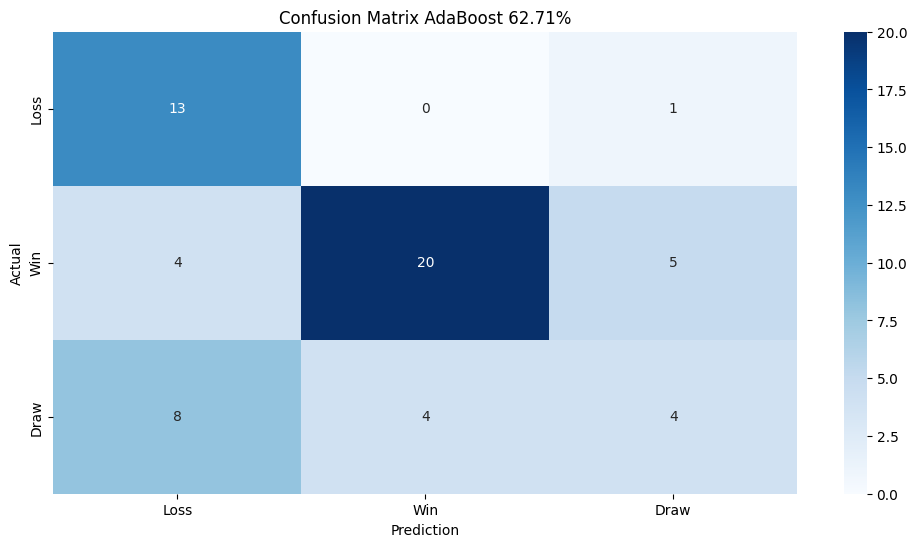

In [28]:
# Evaluate model
ada = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=best_params['estimator__max_depth'], random_state=1), learning_rate=best_params['learning_rate'], n_estimators=best_params['n_estimators'], random_state=1).fit(X_train, y_train)
ada_train_score = ada.score(X_train, y_train)
ada_test_score = ada.score(X_test, y_test)

plt.figure(figsize=(8, 6))
y_pred = ada.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix AdaBoost {ada_test_score*100:.2f}%')

print(f'AdaBoost Bagging with following parameters: {best_params}\nTrain: {ada_train_score:.4f}\nTEST: {ada_test_score:.4f}')

<a id="rf"></a>
#### Random Forest Model
Lastly, I created a Random Forest model. This time I optimized the `n_estimators`, `max_depth`, `min_samples_split`, and `min_samples_leaf` hyperparameters.

Text(0, 0.5, 'Mean Test Score')

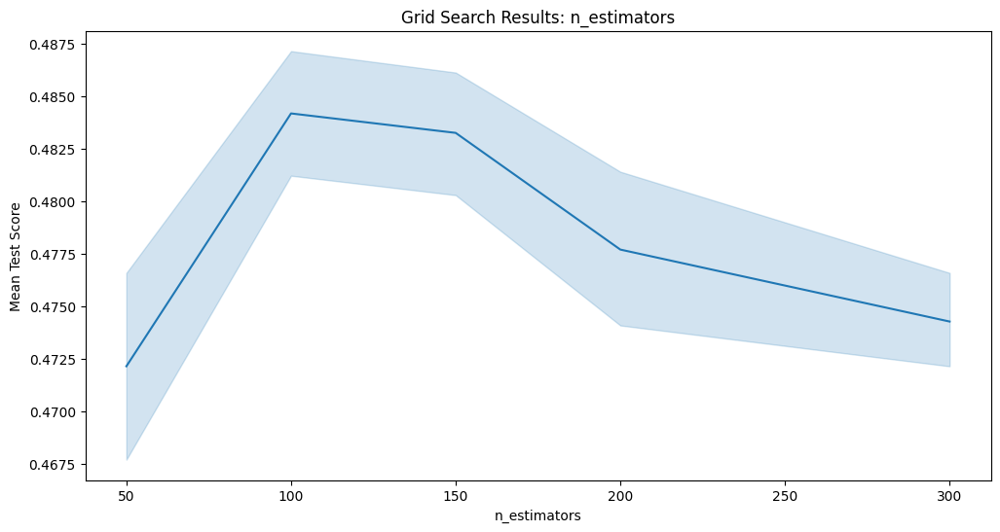

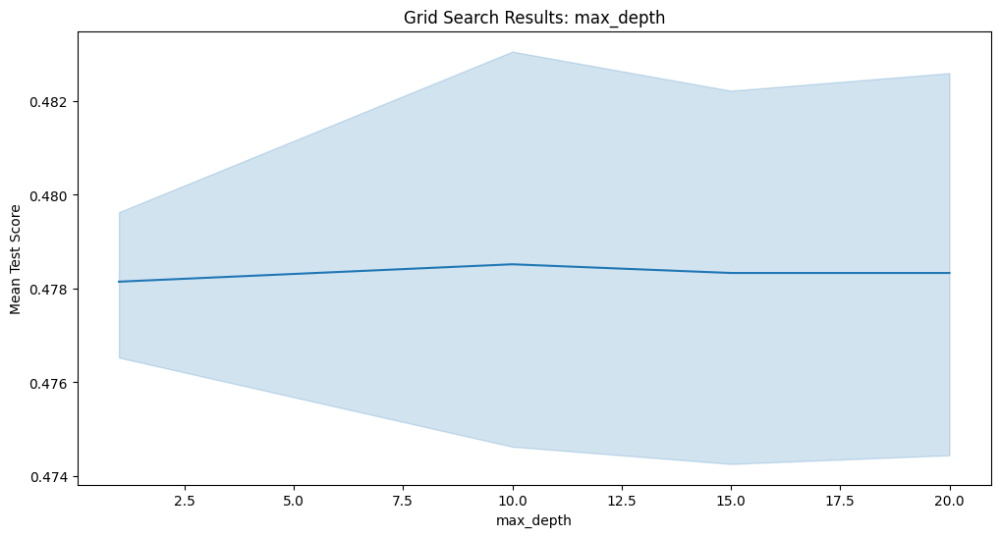

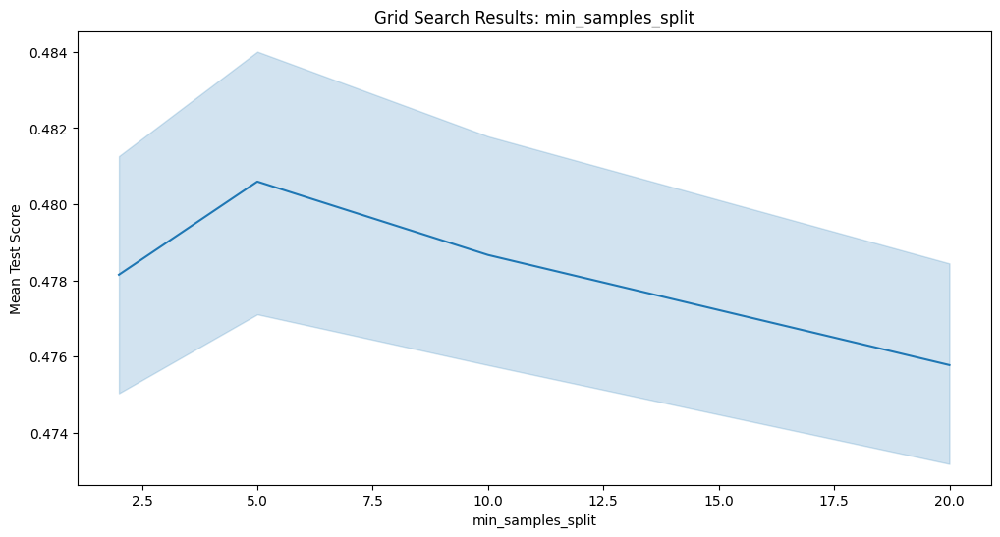

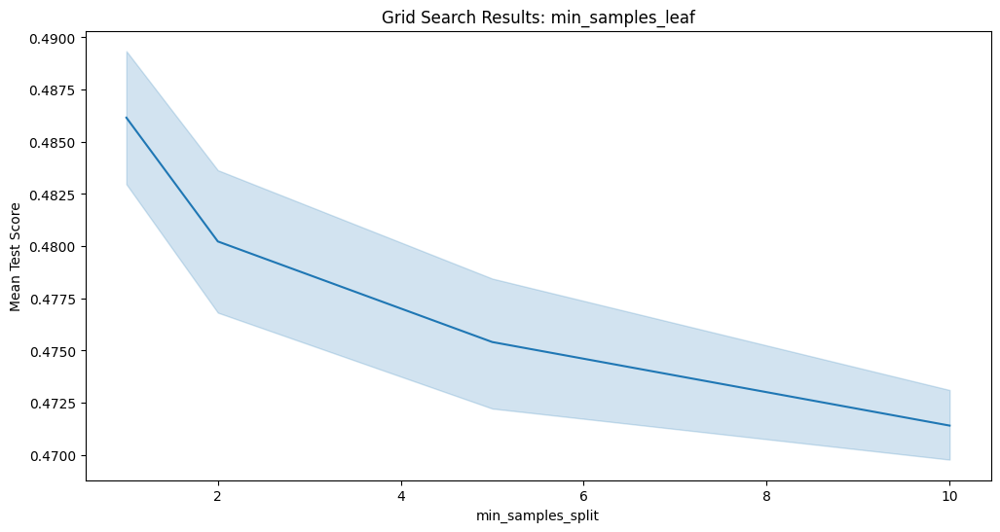

In [29]:
# Perform the grid search cross-validation for best parameters
model = RandomForestClassifier(random_state=1)
param_grid = {'n_estimators': [50, 100, 150, 200, 300], 'max_depth': [1, best_depth, 10, 15, 20], 'min_samples_split': [2, 5, 10, 20], 'min_samples_leaf': [1, 2, 5, 10]}
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1).fit(X_train, y_train)

# Find the best parameters
best_params = grid_search.best_params_
results4 = pd.DataFrame(grid_search.cv_results_)

# Plotting results of grid search cross-validation
plt.figure(figsize=(12, 6))
sns.lineplot(x='param_n_estimators', y='mean_test_score', data=results4)
plt.title('Grid Search Results: n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_max_depth', y='mean_test_score', data=results4)
plt.title('Grid Search Results: max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_min_samples_split', y='mean_test_score', data=results4)
plt.title('Grid Search Results: min_samples_split')
plt.xlabel('min_samples_split')
plt.ylabel('Mean Test Score')

plt.figure(figsize=(12, 6))
sns.lineplot(x='param_min_samples_leaf', y='mean_test_score', data=results4)
plt.title('Grid Search Results: min_samples_leaf')
plt.xlabel('min_samples_split')
plt.ylabel('Mean Test Score')

Random Forest with following parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}
Train: 1.0000
TEST: 0.5424


<Figure size 800x600 with 0 Axes>

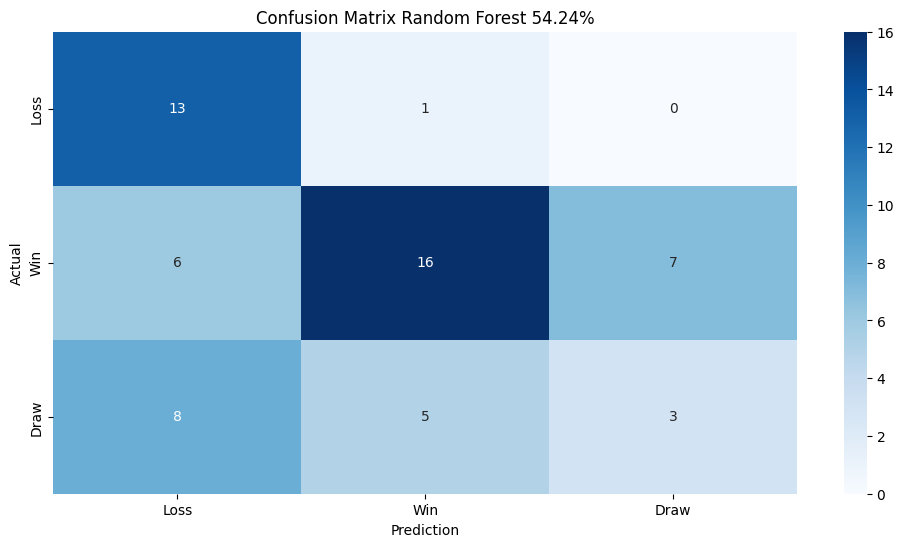

In [30]:
# Evaluate model
rf = RandomForestClassifier(max_depth=best_params['max_depth'], min_samples_split=best_params['min_samples_split'], n_estimators=best_params['n_estimators'], min_samples_leaf=best_params['min_samples_leaf'], random_state=1).fit(X_train, y_train)
rf_train_score = rf.score(X_train, y_train)
rf_test_score = rf.score(X_test, y_test)

plt.figure(figsize=(8, 6))
y_pred = rf.predict(X_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix Random Forest {rf_test_score*100:.2f}%')

print(f'Random Forest with following parameters: {best_params}\nTrain: {rf_train_score:.4f}\nTEST: {rf_test_score:.4f}')

<a id="selection"></a>
#### Model Selection
**Direct Train/Test Score Comparison**

To select a model I first compared their train and test scores directly. Most of the models performed similarly in particular tiers. The worst model on both training and testing data was the Single Decision Tree. As a result, I eliminated this model. Of the remaining models, Random Forest, Gradient Descent, and Bagging Decision Trees all performed similarly, approximately 52-56% on the test set. This is very good performance considering the guessing rate is 33%. Finally, AdaBoost with decision trees, Bagging Logistic Regressions, and a single Logistic Regression performed in a class of their own, approximately 62-66% accuracy. I moved forward in the model selection process with these three models in mind for a comparison.

**Confusion Matrix Comparison**

Next I compared all of the models' confusion matrices. I did this to validate the elimination of all models except AdaBoost, Bagging Logistic Regressions, and single Logistic Regression and then compare these three against each other. According to the confusion matrices, the single Logistic Regression performed the best overall at predicting the correct outcome. This result is tracked along the diagonal starting from top left to bottom right. The Bagging Logistic Regressions did better at correctly predicting wins, the same at predicting losses, and worse at predicting draws than the Logistic Regression model. However, the Logistic Regression model very rarely wrongfully predicted a win. The AdaBoost model did very very good at predicting wins and losses but very poorly comparatively at predicting draws. On its own this still did not make the decision obvious, so I decided to evaluate their ROC curves.

**ROC Curve Comparison**

Finally, I compared how the models' ROC curves looked. To do this, I had to binarize the data as the auc function relies on binary data, not multiclass. When comparing model performance, AdaBoost performed the worst among the top three models I was choosing between. It had the lowest AUC score. Between Logistic Regression and Bagging Logistic Regressions, Bagging Logistic Regressions had a much higher AUC score, in fact, it had the highest among all 7 models despite having the second highest test accuracy. However, it is worth mentioning that on the original train and test scores, the Logistic Regression model overfit less as it had more similar train/test scores than Bagging Logistic Regressions which had almost a perfect train score.

**Final Selection**

Weighing all of these things together, I elected to go with the **Logistic Regression** model. This model had the third closest train/test scores among all 7 models and the highest test accuracy, making it have a good bias/variance tradeoff when compared to the Bagging Logistic Regressions model. Additionally, the confusion matrix for this model demonstrated the most uniform accuracy, meaning that instead of being very good at predicting wins, or very good at distinguishing between wins/losses, this model is the best overall at predicting all three classes: wins, losses, and draws.

In [31]:
# Compare models' train/test performances
model_names = ['Logistic Regression', 'Bagging Logistic Regressions', 'Single Decision Tree', 'Bagging Decision Trees', 'Gradient Descent Boosting', 'AdaBoosting', 'Random Forest']
train_scores = [lr_train_score, bagging_lr_train_score, dt_train_score, bagging_dt_train_score, gd_train_score, ada_train_score, rf_train_score]
test_scores = [lr_test_score, bagging_lr_test_score, dt_test_score, bagging_dt_test_score, gd_test_score, ada_test_score, rf_test_score]
models = pd.DataFrame({'model': model_names, 'train_scores': train_scores, 'test_scores': test_scores})
models

,model,train_scores,test_scores
0,Logistic Regression,0.829630,0.627119
1,Bagging Logistic Regressions,0.970370,0.661017
2,Single Decision Tree,0.533333,0.457627
3,Bagging Decision Trees,1.000000,0.542373
4,Gradient Descent Boosting,1.000000,0.542373
5,AdaBoosting,0.770370,0.627119
6,Random Forest,1.000000,0.542373


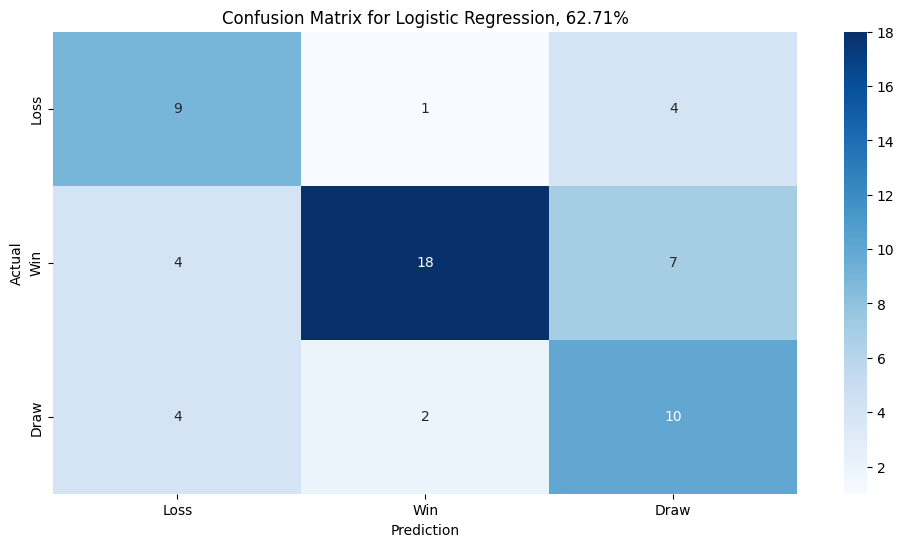

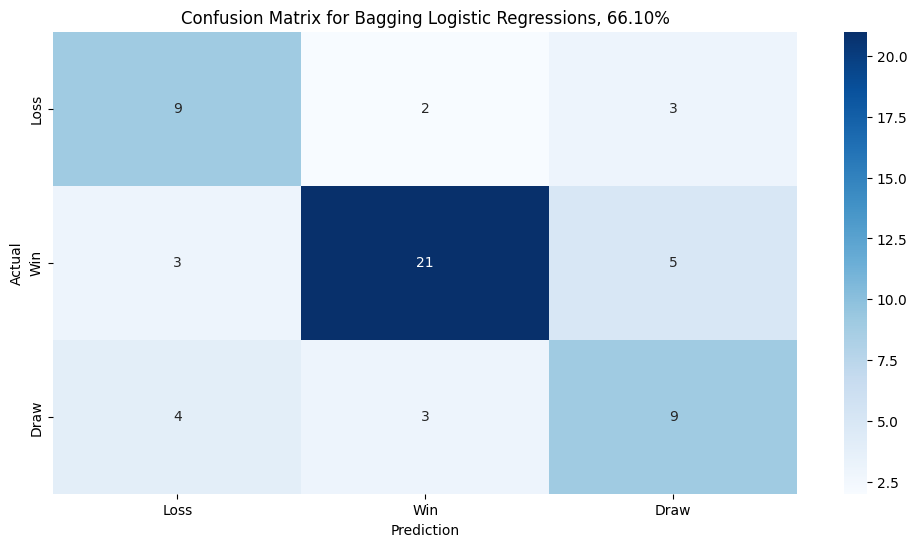

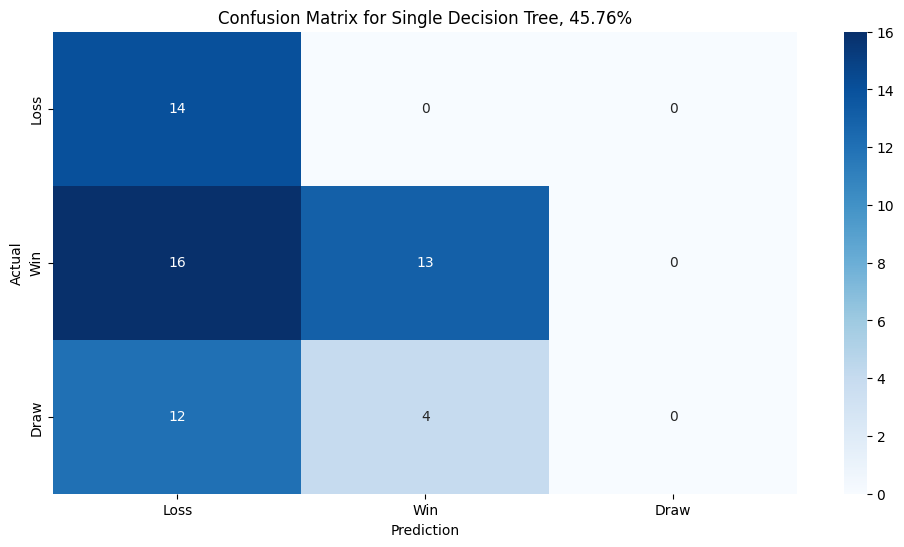

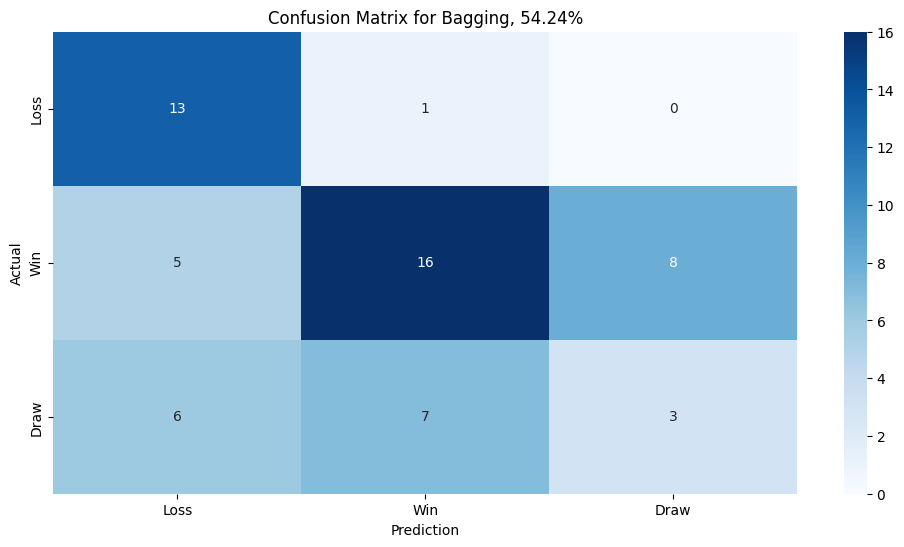

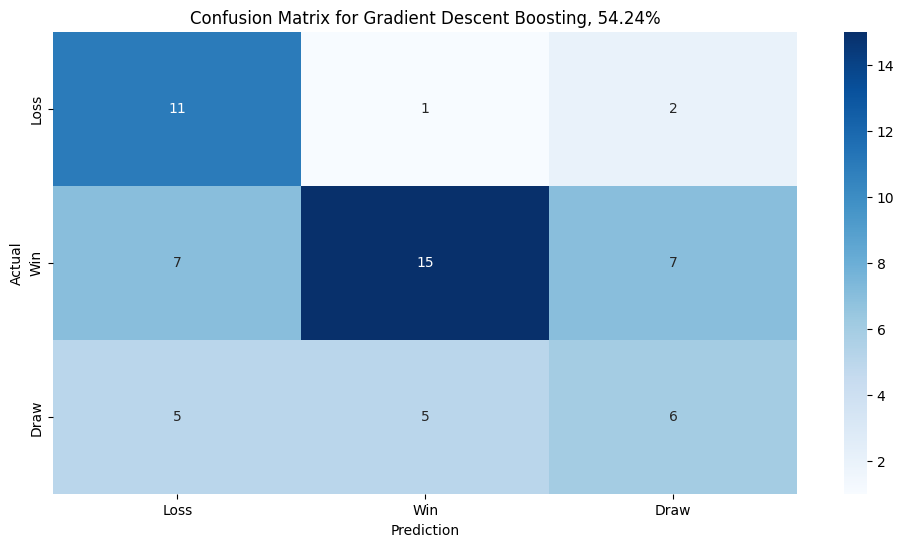

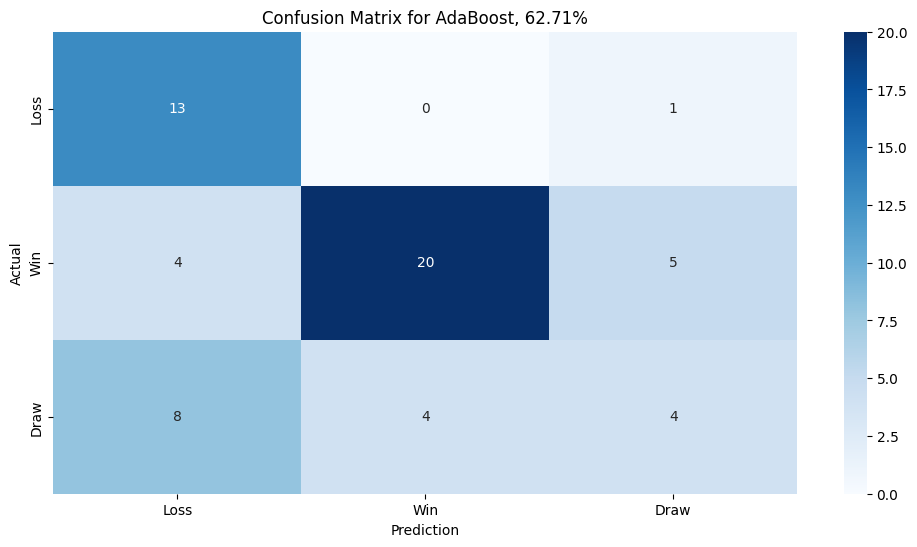

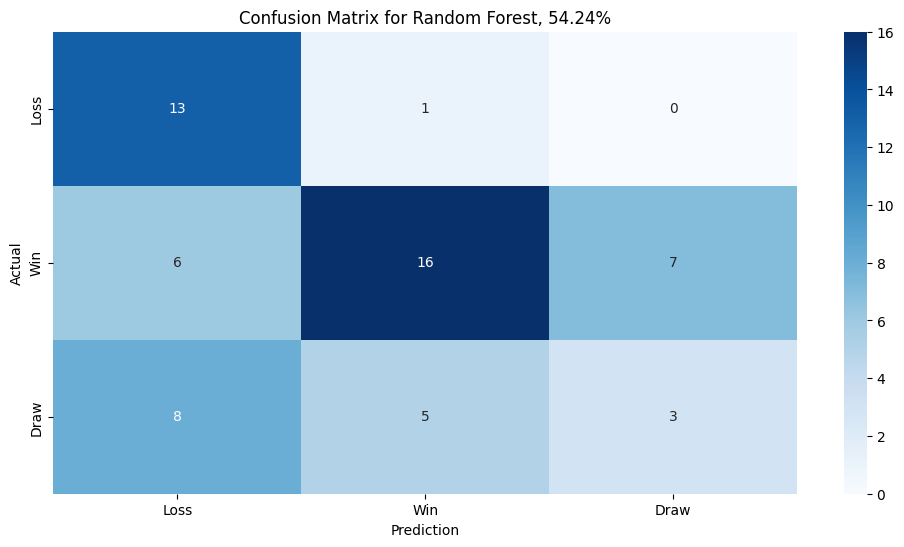

In [32]:
# Plot confusion matrices for all 5 models
models = [lr, bagging_lr, dt, bagging_dt, gd, ada, rf]
for model in models:
    conf_mat = confusion_matrix(y_test, model.predict(X_test))
    plt.figure(figsize=(12, 6))
    sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Loss', 'Win', 'Draw'], yticklabels=['Loss', 'Win', 'Draw'])
    plt.xlabel('Prediction')
    plt.ylabel('Actual')
    if model == lr:
        plt.title(f'Confusion Matrix for Logistic Regression, {lr_test_score*100:.2f}%')
    elif model == bagging_lr:
        plt.title(f'Confusion Matrix for Bagging Logistic Regressions, {bagging_lr_test_score*100:.2f}%')
    elif model == dt:
        plt.title(f'Confusion Matrix for Single Decision Tree, {dt_test_score*100:.2f}%')
    elif model == bagging_dt:
        plt.title(f'Confusion Matrix for Bagging, {bagging_dt_test_score*100:.2f}%')
    elif model == gd:
        plt.title(f'Confusion Matrix for Gradient Descent Boosting, {gd_test_score*100:.2f}%')
    elif model == ada:
        plt.title(f'Confusion Matrix for AdaBoost, {ada_test_score*100:.2f}%')
    else:
        plt.title(f'Confusion Matrix for Random Forest, {rf_test_score*100:.2f}%')

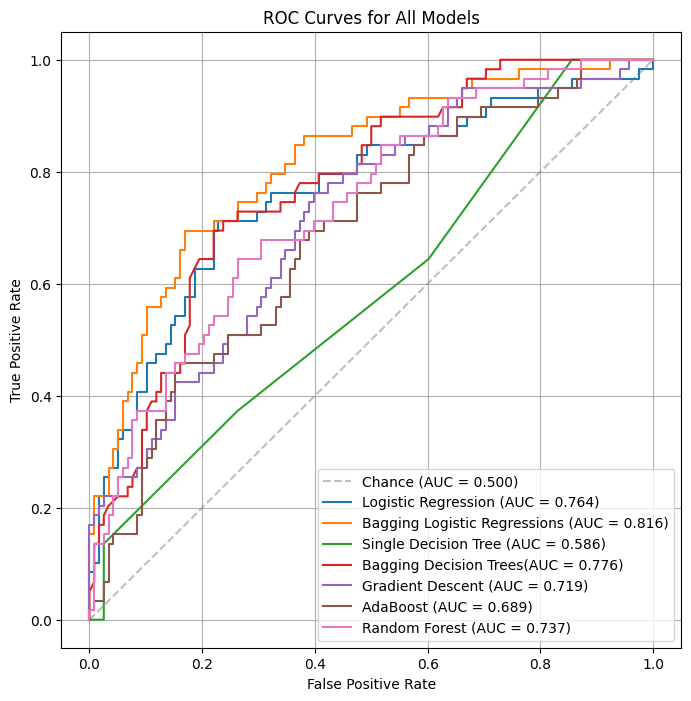

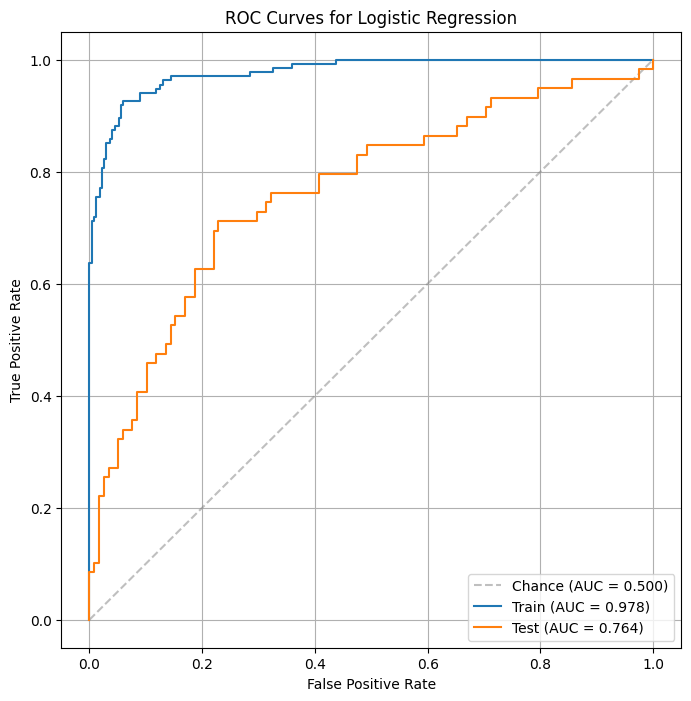

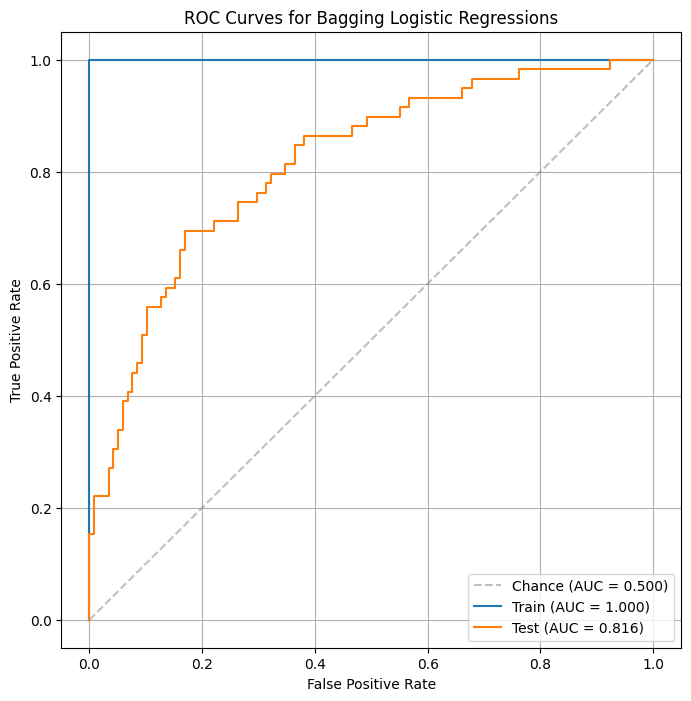

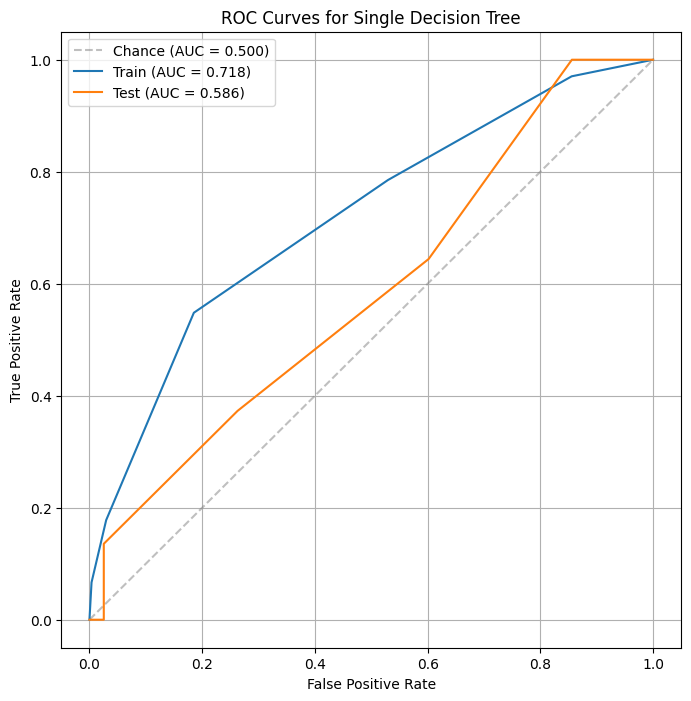

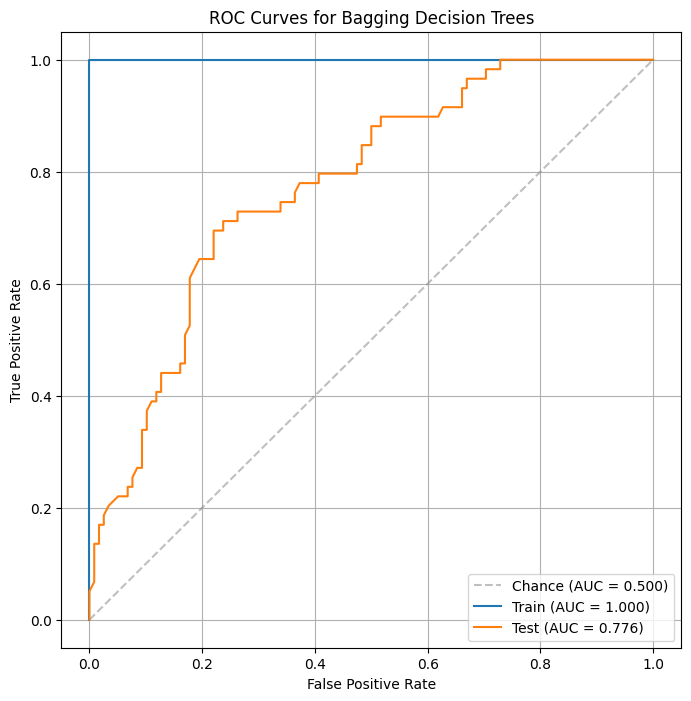

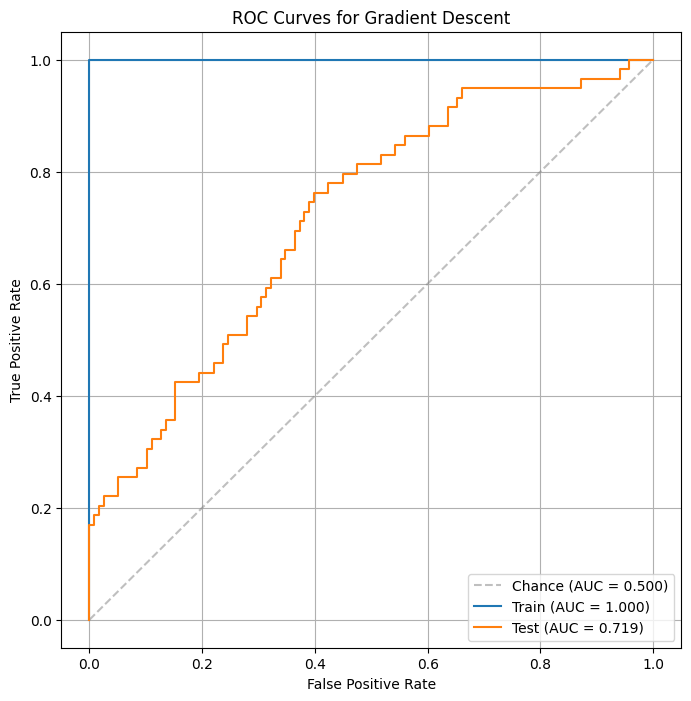

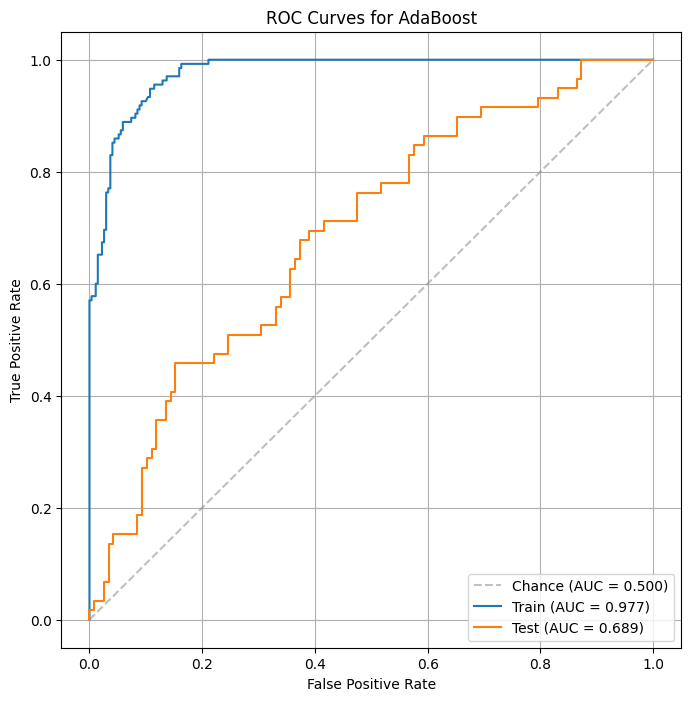

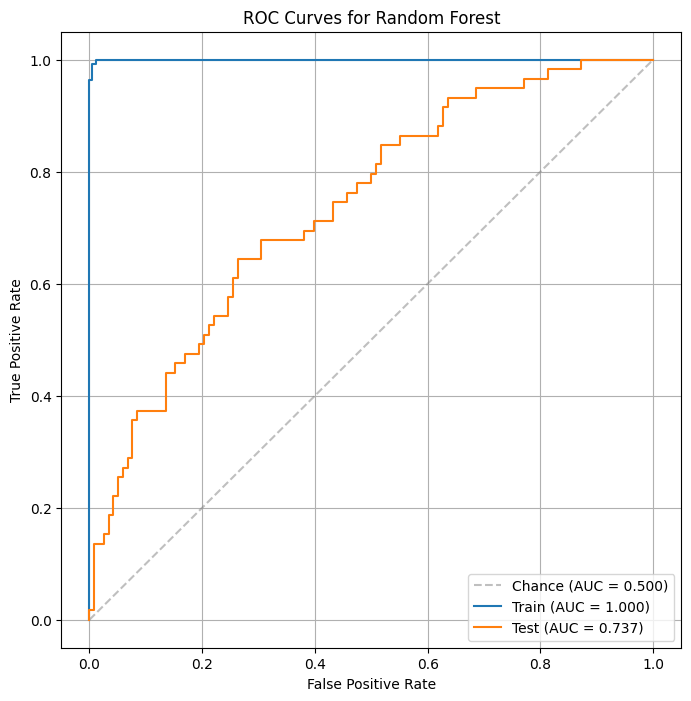

In [33]:
# Binarize the data
y_train_bin = label_binarize(y_train, classes=[0, 1, 2])
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

plt.figure(figsize=(8, 8))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance (AUC = 0.500)', alpha=0.5)

# Plot all of the models' test ROC curves on top of each other
for model in models:
    model_name = type(model).__name__
    classifier = OneVsRestClassifier(model)
    classifier.fit(X_train, y_train_bin)
    y_score = classifier.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)
    if model == lr:
        plt.plot(fpr, tpr, label=f'Logistic Regression (AUC = {roc_auc:.3f})')
    elif model == bagging_lr:
        plt.plot(fpr, tpr, label=f'Bagging Logistic Regressions (AUC = {roc_auc:.3f})')
    elif model == dt:
        plt.plot(fpr, tpr, label=f'Single Decision Tree (AUC = {roc_auc:.3f})')
    elif model == bagging_dt:
        plt.plot(fpr, tpr, label=f'Bagging Decision Trees(AUC = {roc_auc:.3f})')
    elif model == gd:
        plt.plot(fpr, tpr, label=f'Gradient Descent (AUC = {roc_auc:.3f})')
    elif model == ada:
        plt.plot(fpr, tpr, label=f'AdaBoost (AUC = {roc_auc:.3f})')
    else:
        plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.3f})')
plt.legend()
plt.grid(True)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Models')

# Plot all of the models' train and test ROC curves to evaluate overfitting
for model in models:
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance (AUC = 0.500)', alpha=0.5)
    classifier = OneVsRestClassifier(model)
    classifier.fit(X_train, y_train_bin)
    y_train_score = classifier.predict_proba(X_train)
    y_test_score = classifier.predict_proba(X_test)
    train_fpr, train_tpr, _ = roc_curve(y_train_bin.ravel(), y_train_score.ravel())
    test_fpr, test_tpr, _ = roc_curve(y_test_bin.ravel(), y_test_score.ravel())
    train_roc_auc = auc(train_fpr, train_tpr)
    test_roc_auc = auc(test_fpr, test_tpr)
    plt.plot(train_fpr, train_tpr, label=f'Train (AUC = {train_roc_auc:.3f})')
    plt.plot(test_fpr, test_tpr, label=f'Test (AUC = {test_roc_auc:.3f})')
    plt.legend()
    plt.grid(True)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    if model == lr:
        plt.title('ROC Curves for Logistic Regression')
    elif model == bagging_lr:
        plt.title('ROC Curves for Bagging Logistic Regressions')
    elif model == dt:
        plt.title('ROC Curves for Single Decision Tree')
    elif model == bagging_dt:
        plt.title('ROC Curves for Bagging Decision Trees')
    elif model == gd:
        plt.title('ROC Curves for Gradient Descent')
    elif model == ada:
        plt.title('ROC Curves for AdaBoost')
    else:
        plt.title('ROC Curves for Random Forest')

<hr style="height:2.4pt">

<a id="results"></a> 
### Results

[Return to contents](#contents)

<a id="sim"></a>
#### Simulation Setup

In [44]:
# Import the data
df = pd.read_csv('data/fbref_data.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Merge ranking data with FBref data
fifa_ranks = pd.read_csv('data/fifa_ranking-2023-07-20.csv')

fifa_ranks.rank_date = pd.to_datetime(fifa_ranks.rank_date)
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("IR Iran", "Iran")
fifa_ranks['country_full'] = fifa_ranks['country_full'].str.replace("USA", "united states")
fifa_ranks = fifa_ranks[fifa_ranks.rank_date.dt.year >= 2018]
fifa_ranks = fifa_ranks[['rank', 'country_full', 'rank_date']]
fifa_ranks.country_full = fifa_ranks.country_full.str.lower()

df.Team = df.Team.str.lower()
df.Opponent = df.Opponent.str.lower()
df[['away_abv','Opponent']] = df['Opponent'].str.split(' ', n=1, expand=True)
df.Date = pd.to_datetime(df.Date)

fifa_ranks = fifa_ranks.sort_values(by=['rank_date','country_full'])
df = df.sort_values(by =['Date','Team'])

merged = pd.merge_asof(df, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Team', right_by='country_full', direction='backward')
merged_2 = pd.merge_asof(merged, fifa_ranks, left_on='Date', right_on='rank_date',
                       left_by='Opponent', right_by='country_full', direction='backward', suffixes=[None, '_right'])
merged_2 = merged_2.rename({'rank':'team_rank', 'rank_right':'opponent_rank'}, axis=1)
merged_2 = merged_2.drop(columns=['away_abv', 'country_full', 'rank_date','country_full_right','rank_date_right'])
df = merged_2

# Remove columns that indicate the number of goals scored as well as unnecessary columns
df = df.drop(['Date', 'Time', 'Comp', 'Round', 'Day', 'GF', 'GA', 'standard_Gls', 'standard_G/Sh', 'standard_G/SoT', 'standard_PK', 'expected_npxG', 'expected_G-xG', 'passing_Ast', 'gca_GCA', 'gca_PassLive', 'gca_PassDead', 'gca_TO', 'gca_Sh', 'gca_Fld', 'gca_Def', 'sca_TO', 'misc_OG', 'expected_np:G-xG', 'passing_xAG'], axis=1)

# Create X and y, encode 0, 1, 2 instead of W, D, L, drop duplicate columns
df['Result'] = df['Result'].map({'W': 1, 'L': 0, 'D': 2})
df['Venue'] = df['Venue'].map({'Home': 1, 'Away': 0, 'Neutral': 2})

# Inspect team_stats
df = df.dropna()
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
team_stats = df.groupby('Team')[numeric_columns].mean().reset_index()
team_stats = team_stats.drop(['da_Err', 'misc_PKcon', 'misc_2CrdY', 'sca_Def', 'corners_Str', 'passing_xA', 'misc_PKwon', 'misc_CrdR', 'standard_FK', 'standard_PKatt', 'expected_npxG/Sh'], axis=1)
team_stats.head()

,Team,Venue,Result,standard_Sh,standard_SoT,standard_SoT%,standard_Dist,expected_xG,total_passes_Cmp,total_passes_Att,...,misc_Off,misc_Crs,misc_Int,misc_TklW,misc_Recov,aerial_duels_Won,aerial_duels_Lost,aerial_duels_Won%,team_rank,opponent_rank
0,argentina,1.950,1.100000,13.600000,5.450000,40.225000,18.440000,1.995000,441.900000,529.200000,...,1.750000,11.500000,9.650000,10.700000,46.650000,11.550000,11.300000,50.935000,7.150000,26.150000
1,australia,2.000,0.500000,6.500000,2.000000,29.300000,18.325000,0.575000,313.500000,424.000000,...,0.250000,13.500000,10.000000,7.500000,50.000000,18.000000,18.000000,48.425000,38.000000,11.750000
2,austria,2.000,0.333333,14.333333,2.666667,17.366667,18.966667,1.033333,467.000000,585.000000,...,1.333333,18.000000,10.666667,12.333333,64.333333,13.666667,13.666667,50.466667,23.000000,15.666667
3,belgium,1.875,0.875000,10.250000,3.375000,34.162500,18.350000,1.337500,526.125000,617.625000,...,1.125000,13.500000,6.625000,7.625000,46.500000,13.375000,9.500000,59.012500,1.375000,23.625000
4,bolivia,2.000,0.000000,6.142857,2.142857,36.428571,23.600000,0.614286,305.571429,389.142857,...,1.142857,8.571429,10.285714,8.285714,42.142857,8.428571,15.571429,36.714286,72.857143,18.285714


In [45]:
teams = ['argentina',
 'bolivia',
 'brazil',
 'canada',
 'chile',
 'colombia',
 'costa rica',
 'ecuador',
 'mexico',
 'paraguay',
 'peru',
 'united states',
 'uruguay',
 'venezuela',
 'jamaica',
 'panama']
team_stats = team_stats[team_stats['Team'].isin(teams)]

In [46]:
team_stats = pd.concat([team_stats, pd.DataFrame({'Team': ['jamaica', 'panama']})], ignore_index=True)
ref_stats = team_stats[team_stats['Team'].isin(['united states', 'canada', 'costa rica'])]


def impute_stats(team_stats, ref_stats):
    cols_to_impute = team_stats.columns.difference(['Team'])
    for col in cols_to_impute:
        min_val = ref_stats[col].min()
        max_val = ref_stats[col].max()
        imputed_values = np.random.uniform(low=min_val, high=max_val, size=2)
        
        # Use lowercase for 'Team' names in the conditions
        team_stats.loc[team_stats['Team'].str.lower() == 'jamaica', col] = imputed_values[0]
        team_stats.loc[team_stats['Team'].str.lower() == 'panama', col] = imputed_values[1]
    
    return team_stats
team_stats = impute_stats(team_stats, ref_stats)

team_rankings = {
    'argentina': 1,
    'brazil': 5,
    'uruguay': 11,
    'colombia': 15,
    'ecuador': 32,
    'peru': 35,
    'chile': 40,
    'venezuela': 49,
    'paraguay': 53,
    'bolivia': 85,
    'united states': 12,
    'mexico': 14,
    'panama': 41,
    'canada': 48,
    'costa rica': 52,
    'jamaica': 55
}
team_stats['team_rank'] = team_stats['Team'].map(team_rankings)
team_stats = team_stats.drop('Result', axis=1)
team_stats.tail()

,Team,Venue,standard_Sh,standard_SoT,standard_SoT%,standard_Dist,expected_xG,total_passes_Cmp,total_passes_Att,total_passes_Cmp%,...,misc_Off,misc_Crs,misc_Int,misc_TklW,misc_Recov,aerial_duels_Won,aerial_duels_Lost,aerial_duels_Won%,team_rank,opponent_rank
11,united states,2.0,11.000000,2.666667,20.666667,17.300000,0.966667,466.333333,570.000000,81.800000,...,1.333333,24.333333,6.666667,8.666667,50.666667,11.666667,11.666667,49.733333,12,10.666667
12,uruguay,2.0,13.666667,4.333333,29.933333,18.983333,1.558333,395.083333,505.416667,77.600000,...,2.166667,19.833333,10.500000,9.833333,55.333333,17.833333,15.583333,51.375000,11,31.750000
13,venezuela,2.0,7.750000,2.375000,26.100000,21.900000,0.762500,302.625000,393.875000,75.875000,...,1.625000,14.375000,12.000000,9.625000,44.500000,13.625000,17.625000,44.287500,49,24.375000
14,jamaica,2.0,7.517919,1.740778,36.876431,17.723922,0.992407,455.147746,479.373051,81.317443,...,1.678722,10.073261,6.659899,8.870313,48.871600,11.487699,7.455918,57.185803,55,12.128636
15,panama,2.0,8.690890,2.302095,23.876074,17.722006,1.098088,379.808082,508.720643,80.037659,...,1.518726,11.946769,7.962085,9.567412,50.191472,10.036499,7.970382,54.655922,41,11.210061


In [47]:
def sim_match(team1, team2, lr, team_stats):
    stats_team1 = team_stats.loc[team_stats['Team'] == team1]
    stats_team2 = team_stats.loc[team_stats['Team'] == team2]
    
    opponent_rank = stats_team2['team_rank'].values

    stats_team1.loc[:, 'opponent_rank'] = opponent_rank[0]
    stats_team1 = stats_team1.drop(['Team', 'Venue'], axis=1)
    prediction = lr.predict(stats_team1)

    return 'Win' if prediction == 1 else 'Loss' if prediction == 0 else 'Draw'


<a id="ca24"></a>
#### Copa América 2024 Prediction

In [48]:
group_a = ['argentina', 'peru', 'chile', 'canada']
group_b = ['mexico', 'venezuela', 'jamaica', 'ecuador']
group_c = ['united states', 'uruguay', 'panama', 'bolivia']
group_d = ['brazil', 'colombia', 'paraguay', 'costa rica']
groups = {'A': group_a, 'B': group_b, 'C': group_c, 'D': group_d}

simulations_df_columns = [f'{group}{i + 1}' for group in groups for i in range(len(groups[group]))]
simulations_df_columns += ['qf_teams', 'sf_teams', 'final_teams', '3rd_place', '2nd_place', '1st_place']
simulations_df = pd.DataFrame(columns=simulations_df_columns)

simulation_results = {}

for group in groups:
    group_results = {'Win': 3, 'Draw': 1, 'Loss': 0}
    group_standings = {team: 0 for team in groups[group]}

    # Simulate group stage matches
    for match in range(len(groups[group])):
        team1 = groups[group][match]
        for opponent in groups[group]:
            if opponent != team1:
                team2 = opponent
                outcome = sim_match(team1, team2, lr, team_stats)
                group_standings[team1] += group_results[outcome]

    # Sort teams based on points
    sorted_group = sorted(group_standings.items(), key=lambda x: x[1], reverse=True)
    for i, (team, points) in enumerate(sorted_group):
        simulation_results[f'{group}{i + 1}'] = team

# Quarterfinals
qf_teams = [
    simulation_results['A1'], simulation_results['A2'],
    simulation_results['B1'], simulation_results['B2'],
    simulation_results['C1'], simulation_results['C2'],
    simulation_results['D1'], simulation_results['D2']
]
simulation_results['qf_teams'] = qf_teams

# Quarterfinals
if sim_match(qf_teams[0], qf_teams[3], lr, team_stats) == 'Win':
    sf1 = qf_teams[0]
elif sim_match(qf_teams[0], qf_teams[3], lr, team_stats) == 'Draw':
    sf1 = random.choice([qf_teams[0], qf_teams[3]])
if sim_match(qf_teams[2], qf_teams[1], lr, team_stats) == 'Win':
    sf2 = qf_teams[2]
elif sim_match(qf_teams[2], qf_teams[1], lr, team_stats) == 'Draw':
    sf2 = random.choice([qf_teams[2], qf_teams[1]])
else:
    sf2 = qf_teams[1]
if sim_match(qf_teams[4], qf_teams[7], lr, team_stats) == 'Win':
    sf3 = qf_teams[4]
elif sim_match(qf_teams[4], qf_teams[7], lr, team_stats) == 'Draw':
    sf3 = random.choice([qf_teams[4], qf_teams[7]])
else:
    sf3 = qf_teams[7]
if sim_match(qf_teams[6], qf_teams[5], lr, team_stats) == 'Win':
    sf4 = qf_teams[6]
elif sim_match(qf_teams[6], qf_teams[5], lr, team_stats) == 'Draw':
    sf4 = random.choice([qf_teams[6], qf_teams[5]])
else:
    sf4 = qf_teams[5]
sf_teams = [sf1, sf2, sf3, sf4]
simulation_results['sf_teams'] = sf_teams

# Semifinals
if sim_match(sf1, sf2, lr, team_stats) == 'Win':
    f1 = sf1
    t1 = sf2
elif sim_match(sf1, sf2, lr, team_stats) == 'Draw':
    f1 = random.choice([sf1, sf2])
    t1 = sf1 if f1 == sf2 else sf2   
else:
    f1 = sf2
    t1 = sf1
if sim_match(sf3, sf4, lr, team_stats) == 'Win':
    f2 = sf3
    t2 = sf4
elif sim_match(sf3, sf4, lr, team_stats) == 'Draw':
    f2 = random.choice([sf3, sf4])
    t2 = sf3 if f2 == sf4 else sf4
else:
    f2 = sf4
    t2 = sf3
final_teams = [f1, f2]
simulation_results['final_teams'] = final_teams

# 3rd place match
if sim_match(t1, t2, lr, team_stats) == 'Win':
    simulation_results['3rd place'] = t1
elif sim_match(t1, t2, lr, team_stats) == 'Draw':
    simulation_results['3rd place'] = random.choice([t1, t2])
else:
    simulation_results['3rd place'] = t2

# Final
if sim_match(f1, f2, lr, team_stats) == 'Win':
    simulation_results['2nd place'] = f2
    simulation_results['1st place'] = f1
elif sim_match(f1, f2, lr, team_stats) == 'Draw':
    simulation_results['2nd place'] = random.choice([f1, f2])
    simulation_results['1st place'] = f1 if simulation_results['2nd place'] == f2 else f2
else:
    simulation_results['2nd place'] = f1
    simulation_results['1st place'] = f2

print(simulation_results)

{'A1': 'argentina', 'A2': 'peru', 'A3': 'chile', 'A4': 'canada', 'B1': 'venezuela', 'B2': 'mexico', 'B3': 'jamaica', 'B4': 'ecuador', 'C1': 'uruguay', 'C2': 'united states', 'C3': 'panama', 'C4': 'bolivia', 'D1': 'colombia', 'D2': 'brazil', 'D3': 'paraguay', 'D4': 'costa rica', 'qf_teams': ['argentina', 'peru', 'venezuela', 'mexico', 'uruguay', 'united states', 'colombia', 'brazil'], 'sf_teams': ['argentina', 'venezuela', 'brazil', 'colombia'], 'final_teams': ['argentina', 'colombia'], '3rd place': 'brazil', '2nd place': 'colombia', '1st place': 'argentina'}


In [49]:
print('Group Stage\n-------------------')
print(f'Group A\n{simulation_results["A1"]}\n{simulation_results["A2"]}\n{simulation_results["A3"]}\n{simulation_results["A4"]}\n')
print(f'Group B\n{simulation_results["B1"]}\n{simulation_results["B2"]}\n{simulation_results["B3"]}\n{simulation_results["B4"]}\n')
print(f'Group C\n{simulation_results["C1"]}\n{simulation_results["C2"]}\n{simulation_results["C3"]}\n{simulation_results["C4"]}\n')
print(f'Group D\n{simulation_results["D1"]}\n{simulation_results["D2"]}\n{simulation_results["D3"]}\n{simulation_results["D4"]}\n')
print('Quarterfinals\n-------------------')
print(f'{simulation_results["A1"]} vs. {simulation_results["B2"]}: Winner: {sf1}')
print(f'{simulation_results["B1"]} vs. {simulation_results["A2"]}: Winner: {sf2}')
print(f'{simulation_results["C1"]} vs. {simulation_results["D2"]}: Winner: {sf3}')
print(f'{simulation_results["D1"]} vs. {simulation_results["C2"]}: Winner: {sf4}\n')
print('Semifinals\n-------------------')
print(f'{sf1} vs. {sf2}: Winner: {f1}')
print(f'{sf3} vs. {sf4}: Winner: {f2}\n')
print('Third Place Match\n-------------------')
print(f'{t1} vs. {t2}: Winner: {simulation_results["3rd place"]}\n')
print('Final\n-------------------')
print(f'{f1} vs. {f2}: Winner: {simulation_results["1st place"]}\n')
print('Results\n-------------------')
print(f'1st place: {simulation_results["1st place"]}\n2nd place: {simulation_results["2nd place"]}\n3rd place: {simulation_results["3rd place"]}')

Group Stage
-------------------
Group A
argentina
peru
chile
canada

Group B
venezuela
mexico
jamaica
ecuador

Group C
uruguay
united states
panama
bolivia

Group D
colombia
brazil
paraguay
costa rica

Quarterfinals
-------------------
argentina vs. mexico: Winner: argentina
venezuela vs. peru: Winner: venezuela
uruguay vs. brazil: Winner: brazil
colombia vs. united states: Winner: colombia

Semifinals
-------------------
argentina vs. venezuela: Winner: argentina
brazil vs. colombia: Winner: colombia

Third Place Match
-------------------
venezuela vs. brazil: Winner: brazil

Final
-------------------
argentina vs. colombia: Winner: argentina

Results
-------------------
1st place: argentina
2nd place: colombia
3rd place: brazil


<hr style="height:2.4pt">

<a id="conclusion"></a> 
### Conclusion, Inferences, Limitations

[Return to contents](#contents)


**Summary of Results and Inferences**

There were many interesting outcomes of this model and it is safe to say it met our goal of predicting the outcome of the tournament and accounting for upsets. The result of the tournament is one that is still somewhat predictable overall, but with many upsets along the way. Firstly, overall CONCACAF underperformed in this tournament, which is very interesting considering the tournament will be hosted in the United States. You would have to expect the CONCACAF teams to perform at their peaks, however, the model suggests that they will not. Most surprising of which was Canada who bottomed Group A. Another interesting outcome was that Brazil was outperformed in Group D by Colombia and even later was eliminated by Colombia in the semifinal. Brazil is certainly one of the favorites to win, however this was not the case here likely due to the fact that I used recent form when gathering team statistics for the model. Brazil has not performed great recently, dropping points in World Cup Qualification matches to Venezuela and losing to Uruguay, Argentina, and Colombia most recently. Argentina being picked to win the tournament is intuitive as they are likely the betting favorites going into Copa América 2024. Another interesting upset was Jamaica knocking Ecuador out of the tournament. The explanation for this is likely due to Jamaica's favorable rank in the FIFA rankings which the model likely favored when predicting the winner of their head-to-head matchup. Peru is currently the bottom-ranked team in the CONMEBOL World Cup qualifying standings yet made their way to the semifinal before losing to the eventual champions in the model. This outcome would be very favorable for Peru, and this result is very intriguing.

**Limitations**

There are many limitations in this simulation. First off, using recent form to gather team statistics in conjunction with the fact that each team played different opponents in their most recent matches, etc. could have inflated and deflated a team's statistics before being evaluated by the model. This likely punished teams like Brazil who are coming off of poor form and favored teams like Colombia conversely. Another limitaiton was the lack of training data overall. Very few matches in FBref tracked all of the statistics that I used to inform our model, and this coupled with the inability to perform PCA and retain model performance made our final model unnecessarily complex. With more data the model could have performed even better on training and test data. Another limitation was the lack of match data for Jamaica and Panama which I remedied by simply imputing random values dependent on how other CONCACAF teams performed. Of course with match data for these two teams their performances would be much more accurate.

<hr style="height:2.4pt">

<a id="future"></a> 
### Future Work and Scope of Improvement

[Return to contents](#contents)


**More Data**

In a future implementation of this project, I would strive to scrape for more data especially now that the gold standard is to record all of the statistics that I am concerned with. Additionally, I would like to evaluate the model performance against the World Cup 2022 that already occurred. The reason for this is to assess how the model's compounded accuracy impacts the outcome of the entire tournament, since it's individual game prediction accuracy is approximately 66%, across 64 games that number would be much much lower to guess the entire tournament correctly. This is not something that I was able to do for this project considering the lack of data usable for model training.

**Jamaica and Panama**

Of course given the luxury of more statistics, I would not have to impute data for Jamaica and Panama and their performances would be more accurate.

**CONCACAF & CONMEBOL Interaction**

This model seemed to favor CONMEBOL teams, likely due to their higher ranks on average. FIFA rankings in general are poorly measured as the top ranked teams never seem to win the tournaments in the end. It always happens to be the 2nd, 3rd, 4th, or even 5th ranked team among those competing. As a result, I would like to implement our own ranking system depending on feature importance so that this factor can be addressed more appropriately.

**Feature Importance, Collinearity, Interaction Terms**

I did not back out the feature importance from the model, so it is unclear what matters and what does not when it comes to the statistics, meaning, if you were watching a game in real time, you would not know what the model observed as important or unimportant. Additionally, as was seen when conducting our EDA, many of the terms interact with one another as there is evident collinearity. Knowledge of exactly which predictors to drop requires a feature selection algorithm such as PCA which when I implemented worsened our model's performance, however, it would make the model simpler and reduce overfitting.

**How the model works**

The model takes in statistics from a match that already happened, instead of predicting the outcome ahead of time. In order to predict the outcome of a match that has not happened yet, you must input values for the match statistics without truly knowing what will happen. As it currently stands, Argentina might average 70% possession against their last 5 opponents, but in a match with Colombia only get 30% possession and perhaps this causes them to lose. The model in its current state is blind to that fact and runs with the same match statistics each time. This means that if a team happened to have particularly good form in their most recent games, they could be predicted to be the overall winner. In a future implementation I would like to arrange the model to make a prediction for the match before it happens by simulating and guessing what the match statistics will be for both teams. To do this I would have to train a model for each statistic that is trained to approximate the statistics in a head to head match between two teams. Once it is trained well, I implement that model or series of models ahead of a match to gather all of the predicted match statistics between two teams and then run this model to predict the outcome of the match. This was too complicated for this project.

<hr style="height:2.4pt">